### PCA: Electrode Grouping 2  
  
**Grouping 2: Quadrants with Axes Separate**  
  
There are three electrodes within each quadrant that aren't on either axis. These will be grouped together. Then the electrodes on the x axis will be one group and the electrodes on the y axis will be one group. This means Cz will show up in 2 of 6 groups.  
  
**Q1:** Fp2, F8, F4  
**Q2:** Fp1, F7, F3  
**Q3:** O1, T5, P3  
**Q4:** O2, T6, P4  
**X-Axis:** T3, C3, Cz, C4, T4  
**Y-Axis:** Pz, Cz, Fz

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import fastparquet, pyarrow
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
df = pd.read_csv('nulls_dropped.csv')

In [3]:
df = df.drop(columns = 'row')

##### Target Variable Distribution for Dataframe without EEGs and Spectrograms Missing Values

In [4]:
df['expert_consensus'].value_counts(normalize = True)

expert_consensus
Seizure    0.209216
Other      0.189732
GPD        0.157017
GRDA       0.155822
LRDA       0.146853
LPD        0.141360
Name: proportion, dtype: float64

##### Adding Column to Keep Track of Original Index

In [5]:
df['row'] = [i for i in range(df.shape[0])]

##### Splitting Dataframe by Activity Type

In [6]:
def activity_df(activity):
    return pd.DataFrame(df[df['expert_consensus'] == activity]).reset_index().drop(columns = 'index')

In [7]:
seizure_df = activity_df('Seizure')
lpd_df = activity_df('LPD')
gpd_df = activity_df('GPD')
lrda_df = activity_df('LRDA')
grda_df = activity_df('GRDA')
other_df = activity_df('Other')

##### Function to Read and Scale Sub EEGs

In [8]:
def scale(df, row):
    eeg = pd.read_parquet('train_eegs/{}.parquet'.format(df['eeg_id'][row]), engine = 'pyarrow')
    first_row = int(df['eeg_label_offset_seconds'][row] * 200)
    last_row = int(first_row + 10000)
    sub_eeg = eeg[first_row: last_row]
    electrodes = sub_eeg.columns
    scaler = StandardScaler()
    sub_eeg = scaler.fit_transform(sub_eeg)
    sub_eeg = pd.DataFrame(sub_eeg, columns = electrodes)
    return sub_eeg

##### Function for Plotting EEG Signals

In [9]:
def activity_signal_plots(sub_eegs, activities, electrodes, h, w):
    fig, axs = plt.subplots(len(electrodes), len(sub_eegs))
    fig.set_figheight(h)
    fig.set_figwidth(w)
    fig.tight_layout()
    for i in range(len(electrodes)):
        if len(sub_eegs) == 1:
            axs[i].plot(sub_eegs[0][electrodes[i]])
            axs[i].set_title('{}_{}'.format(activities[0], electrodes[i]))
        else:
            for j in range(len(sub_eegs)):
                axs[i][j].plot(sub_eegs[j][electrodes[i]])
                if len(activities) > 1:
                    axs[i][j].set_title('{}_{}'.format(activities[j], electrodes[i]))
                else:
                    axs[i][j].set_title('{}_{}'.format(activities[0], electrodes[i]))
    plt.show()

##### PCA Function

In [10]:
def pca_function(sub_eeg, group, n):
    sub_eeg = sub_eeg[group]
    pca = PCA(n_components = n, random_state = 42)
    sub_eeg = pca.fit_transform(sub_eeg)
    ratio = pca.explained_variance_ratio_
    sub_eeg = pd.DataFrame(sub_eeg, columns = ['component_{}'.format(i) for i in range(n)])
    return sub_eeg, ratio

### EEG Indexes by Activity Type  
  
These will be manually set to match the random indexes generated in the first notebook so that PCA is being done with the same sets of sub EEGs.

In [11]:
seizure_random = [16905, 3162, 9351, 17307, 10034]
lpd_random = [7342, 8731, 4898, 11493, 639]
gpd_random = [4595, 11408, 537, 12154, 1935]
lrda_random = [388, 11148, 1711, 5242, 3911]
grda_random = [12264, 5631, 8640, 3704, 11767]
other_random = [9492, 10642, 13840, 3519, 1577]

### Grouping 2: Quadrants with Axes Separate  
  
**Q1:** Fp2, F8, F4  
**Q2:** Fp1, F7, F3  
**Q3:** O1, T5, P3  
**Q4:** O2, T6, P4  
**X-Axis:** T3, C3, Cz, C4, T4  
**Y-Axis:** Pz, Cz, Fz

In [12]:
group2_q1 = ['Fp2', 'F4', 'F8']
group2_q2 = ['Fp1', 'F3', 'F7']
group2_q3 = ['P3', 'T5', 'O1']
group2_q4 = ['P4', 'T6', 'O2']
group2_xaxis = ['C3', 'T3', 'Cz', 'C4', 'T4']
group2_yaxis = ['Fz', 'Cz', 'Pz']

##### Seizure Q1

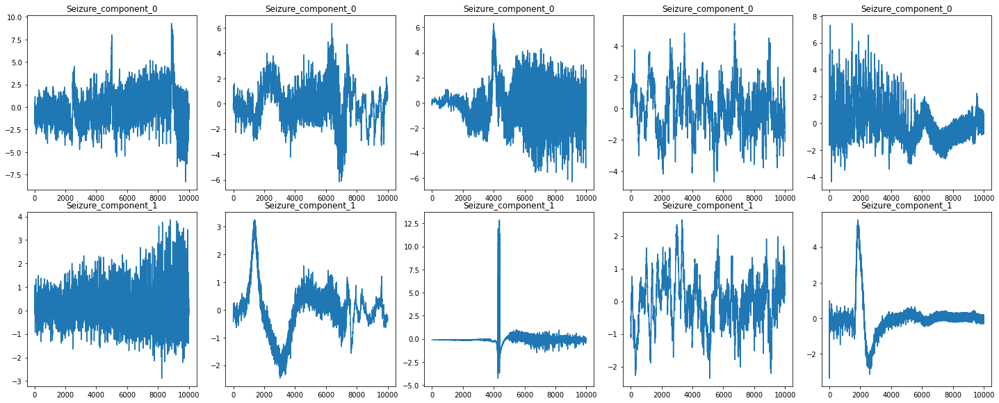

In [13]:
s1_g2q1, s1_g2q1_ratio = pca_function(scale(seizure_df, seizure_random[0]), group2_q1, 2)
s2_g2q1, s2_g2q1_ratio = pca_function(scale(seizure_df, seizure_random[1]), group2_q1, 2)
s3_g2q1, s3_g2q1_ratio = pca_function(scale(seizure_df, seizure_random[2]), group2_q1, 2)
s4_g2q1, s4_g2q1_ratio = pca_function(scale(seizure_df, seizure_random[3]), group2_q1, 2)
s5_g2q1, s5_g2q1_ratio = pca_function(scale(seizure_df, seizure_random[4]), group2_q1, 2)

components = s1_g2q1.columns

sub_eeg_list = [s1_g2q1, s2_g2q1, s3_g2q1, s4_g2q1, s5_g2q1]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

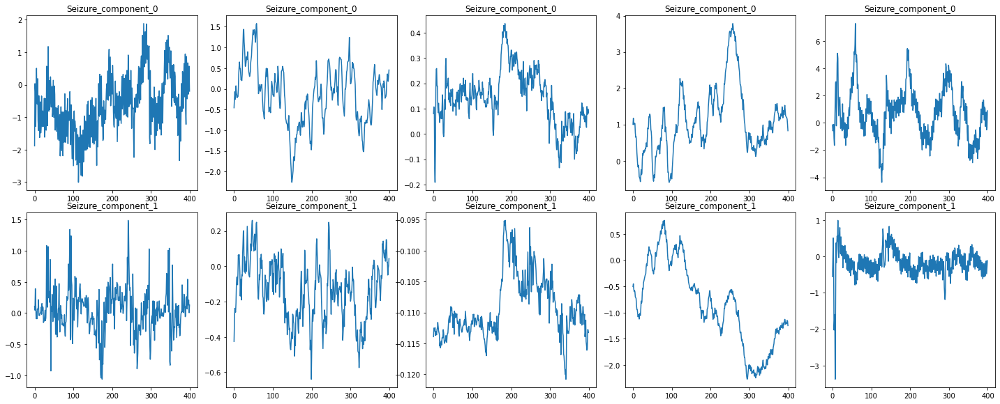

In [14]:
sub_eeg_list = [s1_g2q1[0:400], s2_g2q1[0:400], s3_g2q1[0:400], s4_g2q1[0:400], s5_g2q1[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

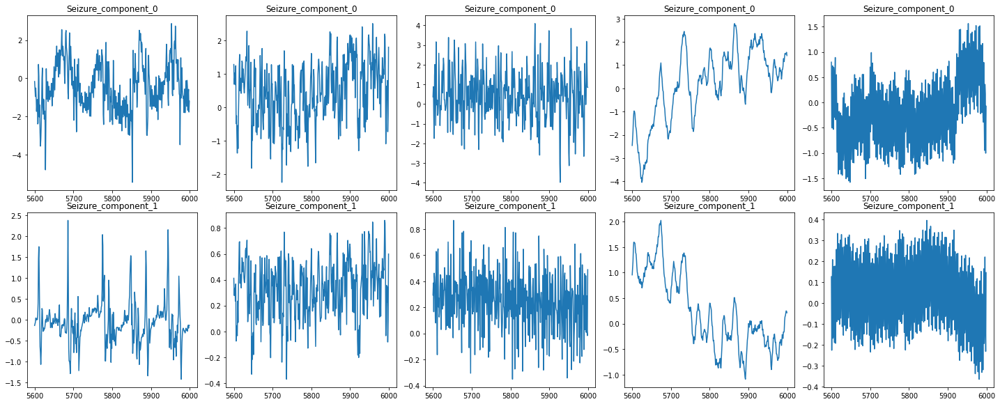

In [15]:
sub_eeg_list = [s1_g2q1[5600:6000], s2_g2q1[5600:6000], s3_g2q1[5600:6000], s4_g2q1[5600:6000], 
                s5_g2q1[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

##### Seizure Q2

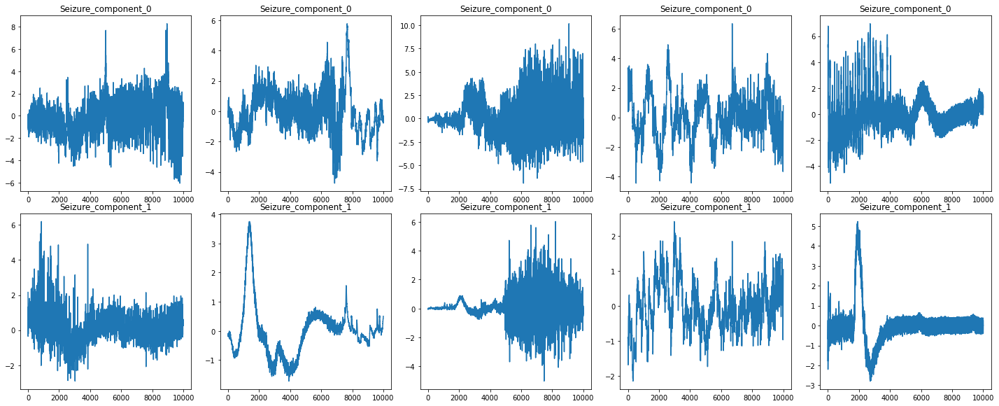

In [16]:
s1_g2q2, s1_g2q2_ratio = pca_function(scale(seizure_df, seizure_random[0]), group2_q2, 2)
s2_g2q2, s2_g2q2_ratio = pca_function(scale(seizure_df, seizure_random[1]), group2_q2, 2)
s3_g2q2, s3_g2q2_ratio = pca_function(scale(seizure_df, seizure_random[2]), group2_q2, 2)
s4_g2q2, s4_g2q2_ratio = pca_function(scale(seizure_df, seizure_random[3]), group2_q2, 2)
s5_g2q2, s5_g2q2_ratio = pca_function(scale(seizure_df, seizure_random[4]), group2_q2, 2)

components = s1_g2q2.columns

sub_eeg_list = [s1_g2q2, s2_g2q2, s3_g2q2, s4_g2q2, s5_g2q2]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

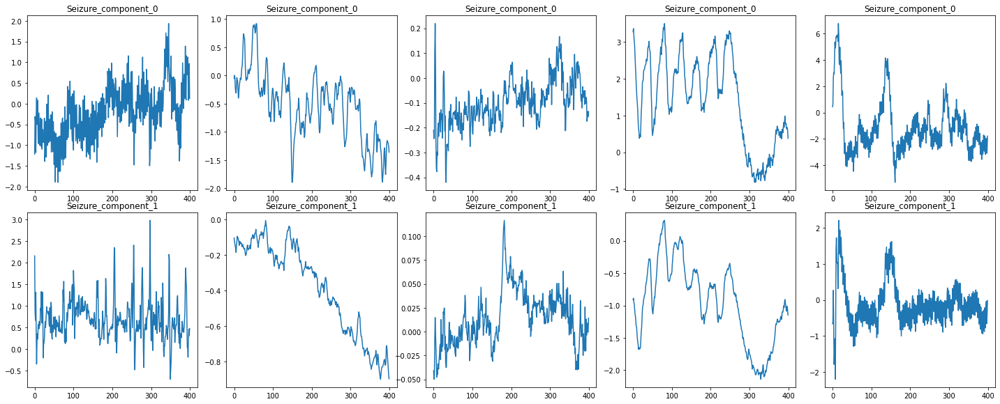

In [17]:
sub_eeg_list = [s1_g2q2[0:400], s2_g2q2[0:400], s3_g2q2[0:400], s4_g2q2[0:400], s5_g2q2[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

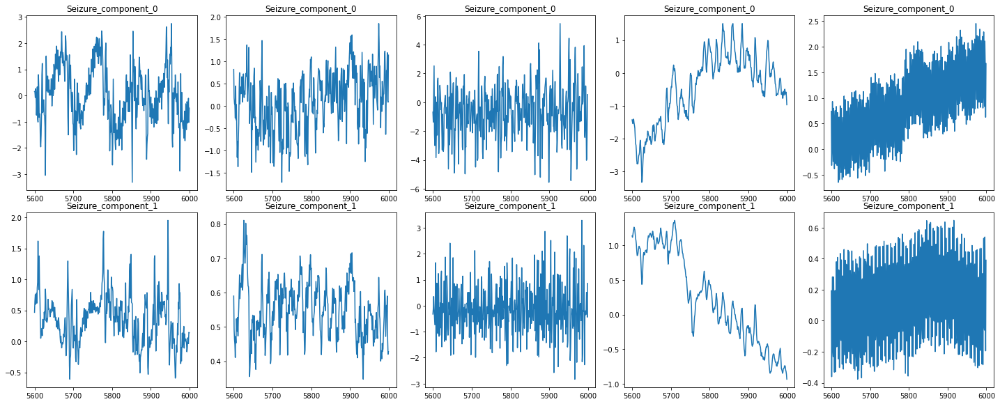

In [18]:
sub_eeg_list = [s1_g2q2[5600:6000], s2_g2q2[5600:6000], s3_g2q2[5600:6000], s4_g2q2[5600:6000], 
                s5_g2q2[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

##### Seizure Q3

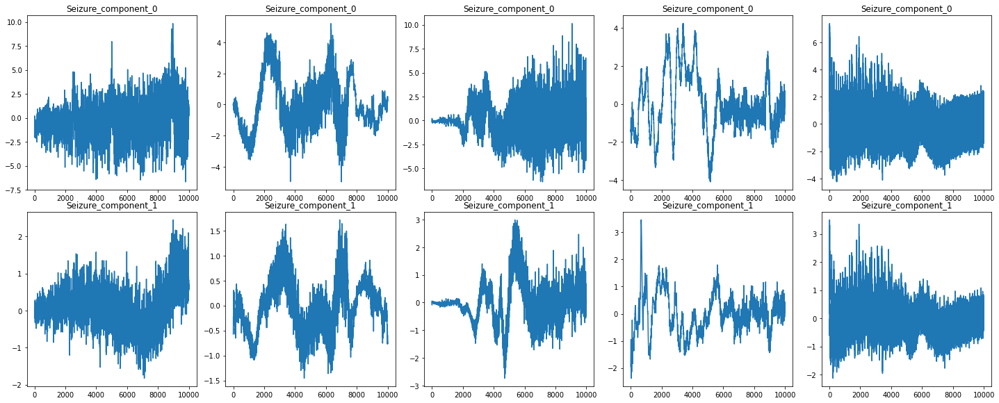

In [19]:
s1_g2q3, s1_g2q3_ratio = pca_function(scale(seizure_df, seizure_random[0]), group2_q3, 2)
s2_g2q3, s2_g2q3_ratio = pca_function(scale(seizure_df, seizure_random[1]), group2_q3, 2)
s3_g2q3, s3_g2q3_ratio = pca_function(scale(seizure_df, seizure_random[2]), group2_q3, 2)
s4_g2q3, s4_g2q3_ratio = pca_function(scale(seizure_df, seizure_random[3]), group2_q3, 2)
s5_g2q3, s5_g2q3_ratio = pca_function(scale(seizure_df, seizure_random[4]), group2_q3, 2)

components = s1_g2q3.columns

sub_eeg_list = [s1_g2q3, s2_g2q3, s3_g2q3, s4_g2q3, s5_g2q3]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

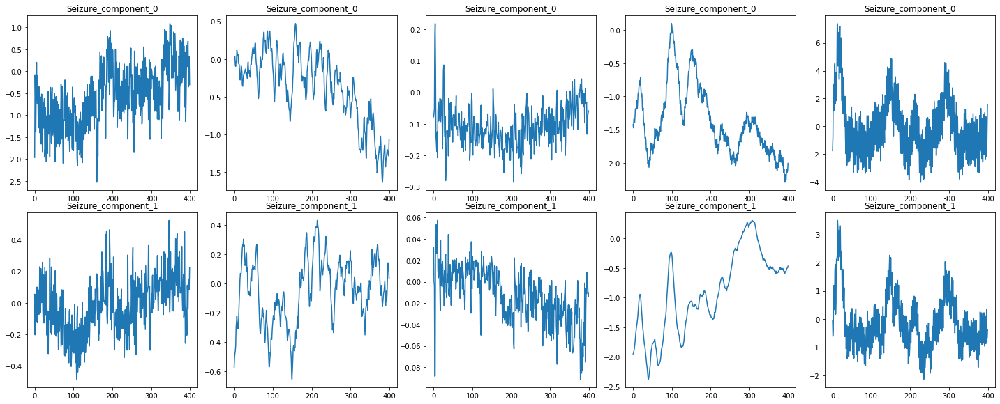

In [20]:
sub_eeg_list = [s1_g2q3[0:400], s2_g2q3[0:400], s3_g2q3[0:400], s4_g2q3[0:400], s5_g2q3[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

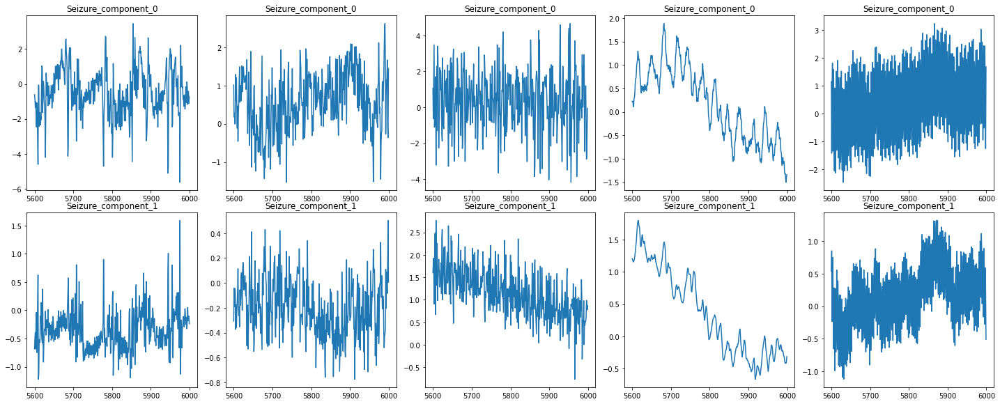

In [21]:
sub_eeg_list = [s1_g2q3[5600:6000], s2_g2q3[5600:6000], s3_g2q3[5600:6000], s4_g2q3[5600:6000], 
                s5_g2q3[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

##### Seizure Q4

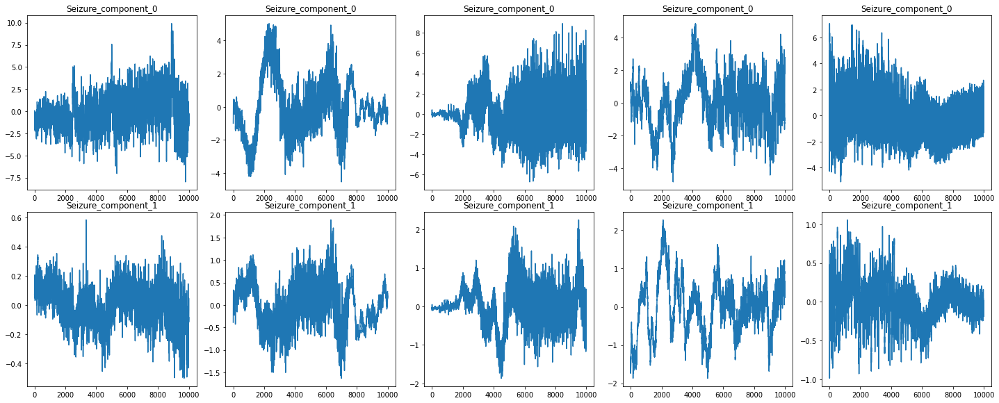

In [22]:
s1_g2q4, s1_g2q4_ratio = pca_function(scale(seizure_df, seizure_random[0]), group2_q4, 2)
s2_g2q4, s2_g2q4_ratio = pca_function(scale(seizure_df, seizure_random[1]), group2_q4, 2)
s3_g2q4, s3_g2q4_ratio = pca_function(scale(seizure_df, seizure_random[2]), group2_q4, 2)
s4_g2q4, s4_g2q4_ratio = pca_function(scale(seizure_df, seizure_random[3]), group2_q4, 2)
s5_g2q4, s5_g2q4_ratio = pca_function(scale(seizure_df, seizure_random[4]), group2_q4, 2)

components = s1_g2q4.columns

sub_eeg_list = [s1_g2q4, s2_g2q4, s3_g2q4, s4_g2q4, s5_g2q4]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

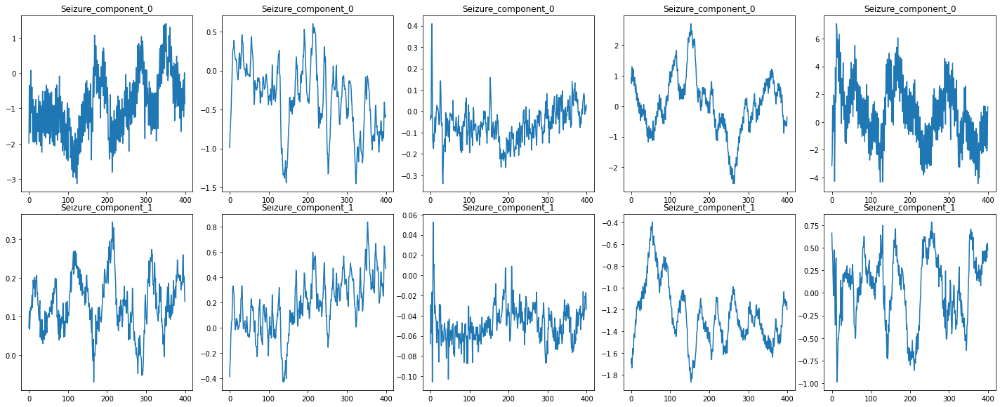

In [23]:
sub_eeg_list = [s1_g2q4[0:400], s2_g2q4[0:400], s3_g2q4[0:400], s4_g2q4[0:400], s5_g2q4[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

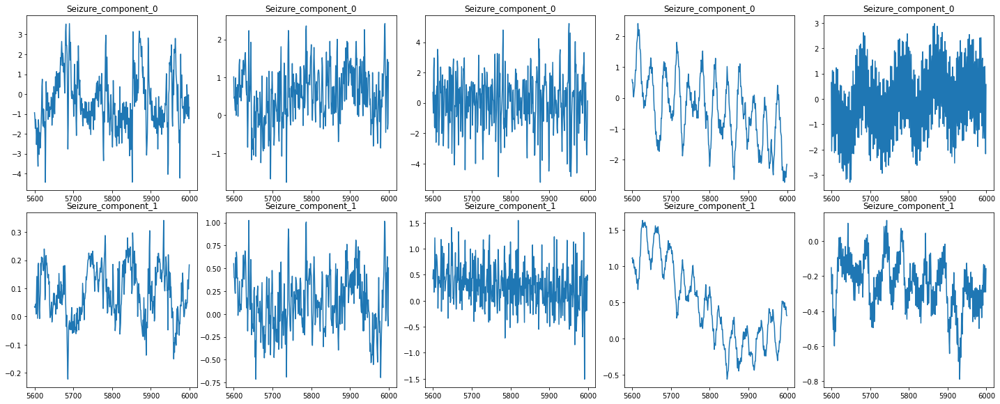

In [24]:
sub_eeg_list = [s1_g2q4[5600:6000], s2_g2q4[5600:6000], s3_g2q4[5600:6000], s4_g2q4[5600:6000], 
                s5_g2q4[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

##### Seizure X

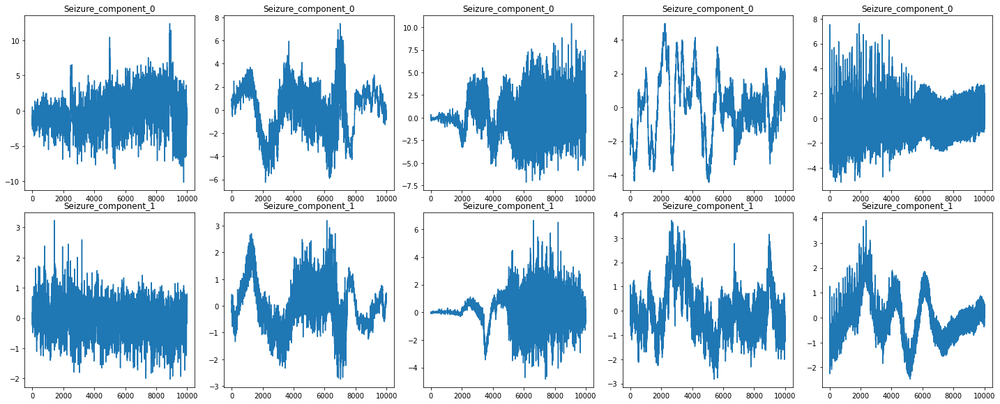

In [25]:
s1_g2xaxis, s1_g2xaxis_ratio = pca_function(scale(seizure_df, seizure_random[0]), group2_xaxis, 2)
s2_g2xaxis, s2_g2xaxis_ratio = pca_function(scale(seizure_df, seizure_random[1]), group2_xaxis, 2)
s3_g2xaxis, s3_g2xaxis_ratio = pca_function(scale(seizure_df, seizure_random[2]), group2_xaxis, 2)
s4_g2xaxis, s4_g2xaxis_ratio = pca_function(scale(seizure_df, seizure_random[3]), group2_xaxis, 2)
s5_g2xaxis, s5_g2xaxis_ratio = pca_function(scale(seizure_df, seizure_random[4]), group2_xaxis, 2)

components = s1_g2xaxis.columns

sub_eeg_list = [s1_g2xaxis, s2_g2xaxis, s3_g2xaxis, s4_g2xaxis, s5_g2xaxis]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

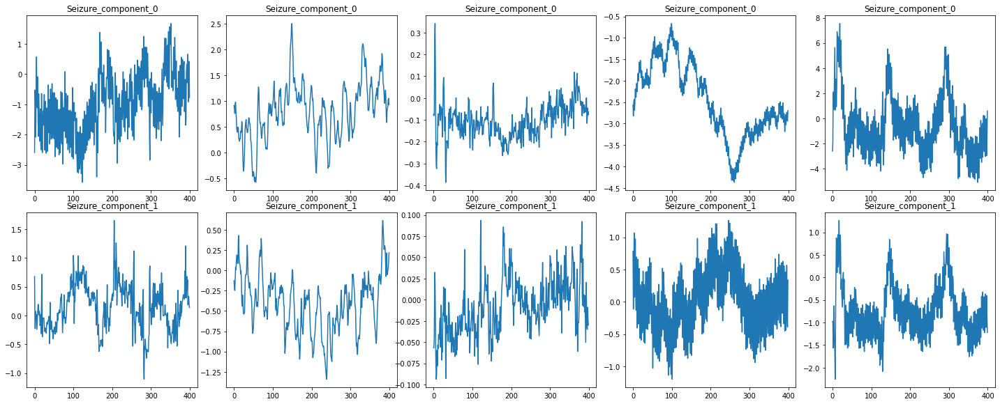

In [26]:
sub_eeg_list = [s1_g2xaxis[0:400], s2_g2xaxis[0:400], s3_g2xaxis[0:400], s4_g2xaxis[0:400], s5_g2xaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

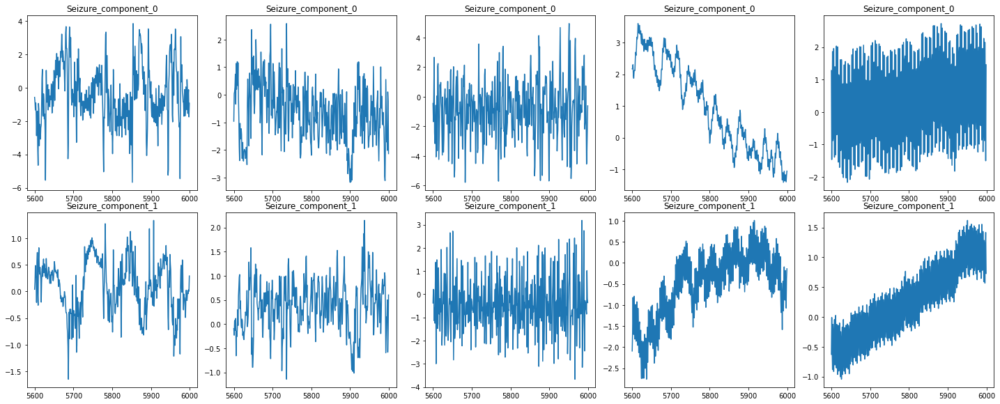

In [27]:
sub_eeg_list = [s1_g2xaxis[5600:6000], s2_g2xaxis[5600:6000], s3_g2xaxis[5600:6000], s4_g2xaxis[5600:6000], 
                s5_g2xaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

##### Seizure Y

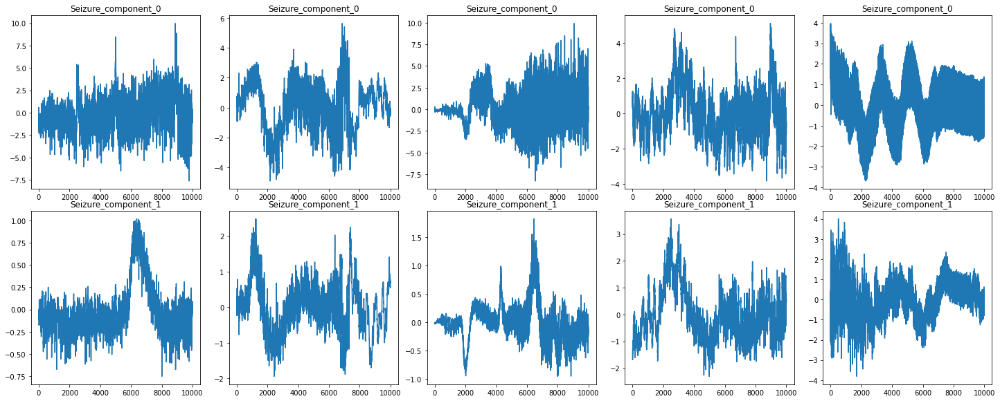

In [28]:
s1_g2yaxis, s1_g2yaxis_ratio = pca_function(scale(seizure_df, seizure_random[0]), group2_yaxis, 2)
s2_g2yaxis, s2_g2yaxis_ratio = pca_function(scale(seizure_df, seizure_random[1]), group2_yaxis, 2)
s3_g2yaxis, s3_g2yaxis_ratio = pca_function(scale(seizure_df, seizure_random[2]), group2_yaxis, 2)
s4_g2yaxis, s4_g2yaxis_ratio = pca_function(scale(seizure_df, seizure_random[3]), group2_yaxis, 2)
s5_g2yaxis, s5_g2yaxis_ratio = pca_function(scale(seizure_df, seizure_random[4]), group2_yaxis, 2)

components = s1_g2yaxis.columns

sub_eeg_list = [s1_g2yaxis, s2_g2yaxis, s3_g2yaxis, s4_g2yaxis, s5_g2yaxis]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

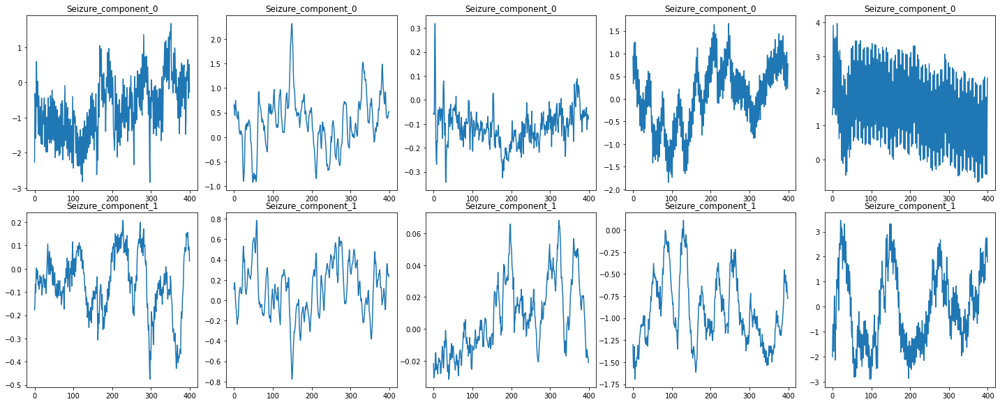

In [29]:
sub_eeg_list = [s1_g2yaxis[0:400], s2_g2yaxis[0:400], s3_g2yaxis[0:400], s4_g2yaxis[0:400], s5_g2yaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

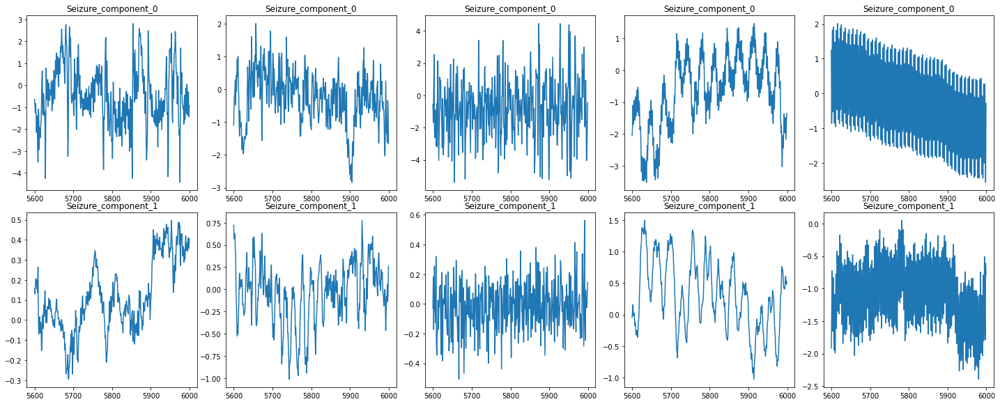

In [30]:
sub_eeg_list = [s1_g2yaxis[5600:6000], s2_g2yaxis[5600:6000], s3_g2yaxis[5600:6000], s4_g2yaxis[5600:6000], 
                s5_g2yaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 8, 20)

##### LPD Q1

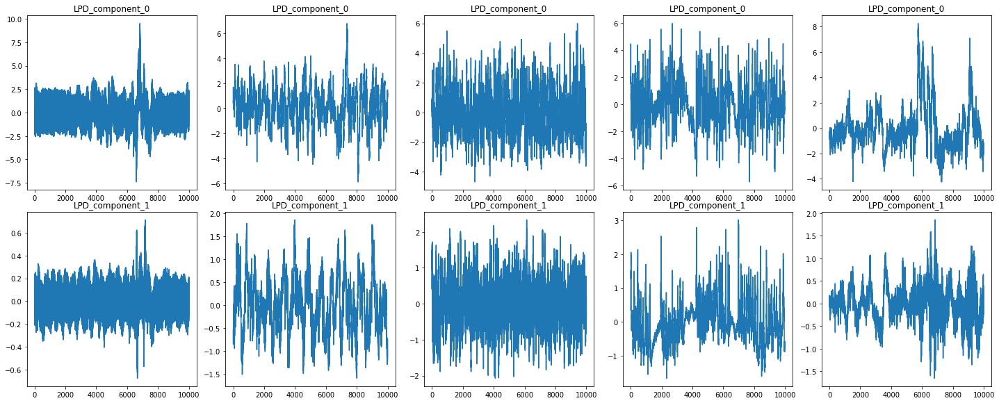

In [31]:
lpd1_g2q1, lpd1_g2q1_ratio = pca_function(scale(lpd_df, lpd_random[0]), group2_q1, 2)
lpd2_g2q1, lpd2_g2q1_ratio = pca_function(scale(lpd_df, lpd_random[1]), group2_q1, 2)
lpd3_g2q1, lpd3_g2q1_ratio = pca_function(scale(lpd_df, lpd_random[2]), group2_q1, 2)
lpd4_g2q1, lpd4_g2q1_ratio = pca_function(scale(lpd_df, lpd_random[3]), group2_q1, 2)
lpd5_g2q1, lpd5_g2q1_ratio = pca_function(scale(lpd_df, lpd_random[4]), group2_q1, 2)

components = lpd1_g2q1.columns

sub_eeg_list = [lpd1_g2q1, lpd2_g2q1, lpd3_g2q1, lpd4_g2q1, lpd5_g2q1]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

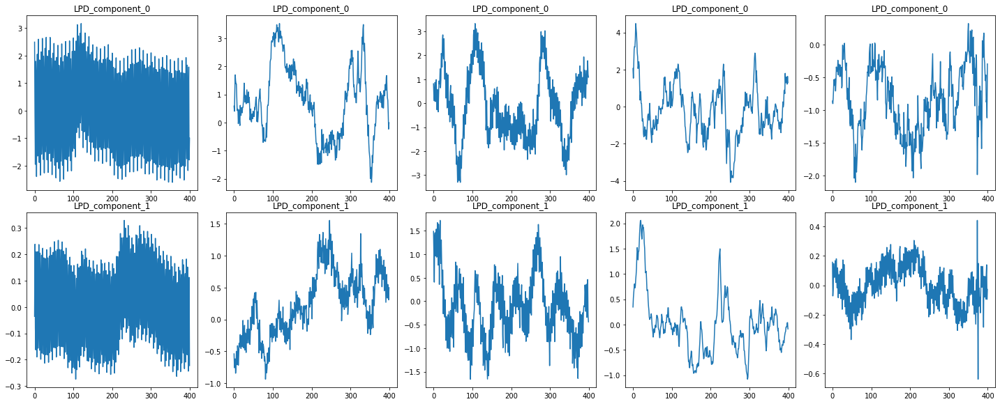

In [32]:
sub_eeg_list = [lpd1_g2q1[0:400], lpd2_g2q1[0:400], lpd3_g2q1[0:400], lpd4_g2q1[0:400], lpd5_g2q1[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

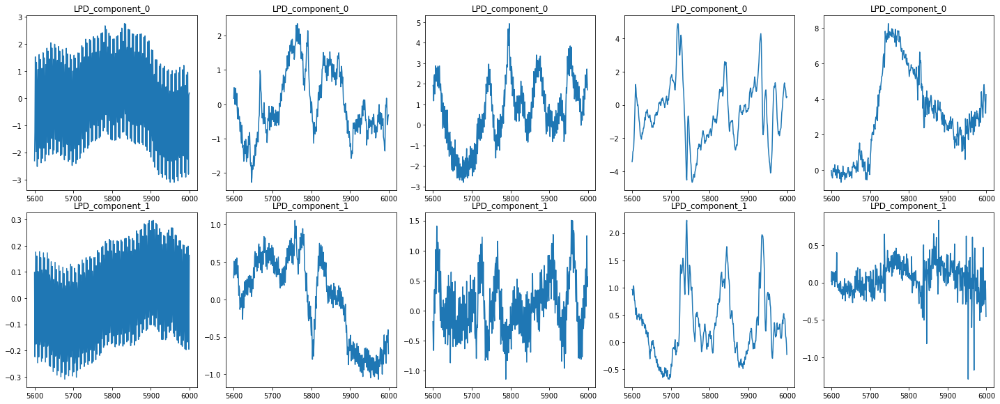

In [33]:
sub_eeg_list = [lpd1_g2q1[5600:6000], lpd2_g2q1[5600:6000], lpd3_g2q1[5600:6000], lpd4_g2q1[5600:6000], 
                lpd5_g2q1[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

##### LPD Q2

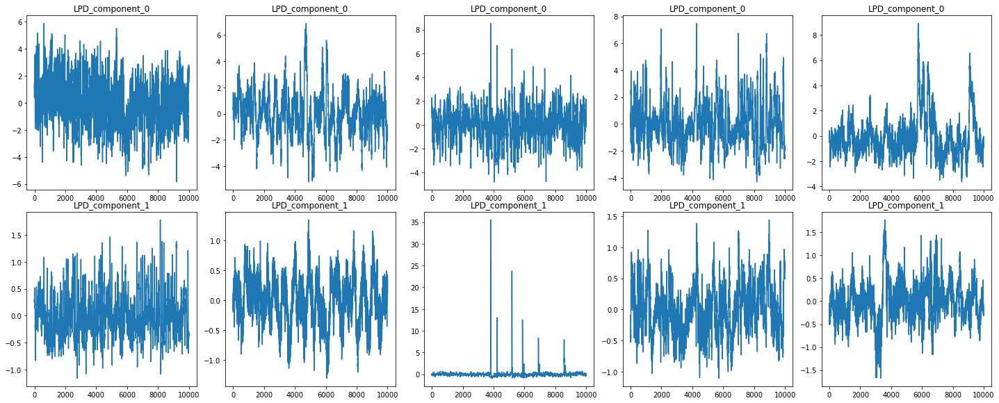

In [34]:
lpd1_g2q2, lpd1_g2q2_ratio = pca_function(scale(lpd_df, lpd_random[0]), group2_q2, 2)
lpd2_g2q2, lpd2_g2q2_ratio = pca_function(scale(lpd_df, lpd_random[1]), group2_q2, 2)
lpd3_g2q2, lpd3_g2q2_ratio = pca_function(scale(lpd_df, lpd_random[2]), group2_q2, 2)
lpd4_g2q2, lpd4_g2q2_ratio = pca_function(scale(lpd_df, lpd_random[3]), group2_q2, 2)
lpd5_g2q2, lpd5_g2q2_ratio = pca_function(scale(lpd_df, lpd_random[4]), group2_q2, 2)

components = lpd1_g2q2.columns

sub_eeg_list = [lpd1_g2q2, lpd2_g2q2, lpd3_g2q2, lpd4_g2q2, lpd5_g2q2]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

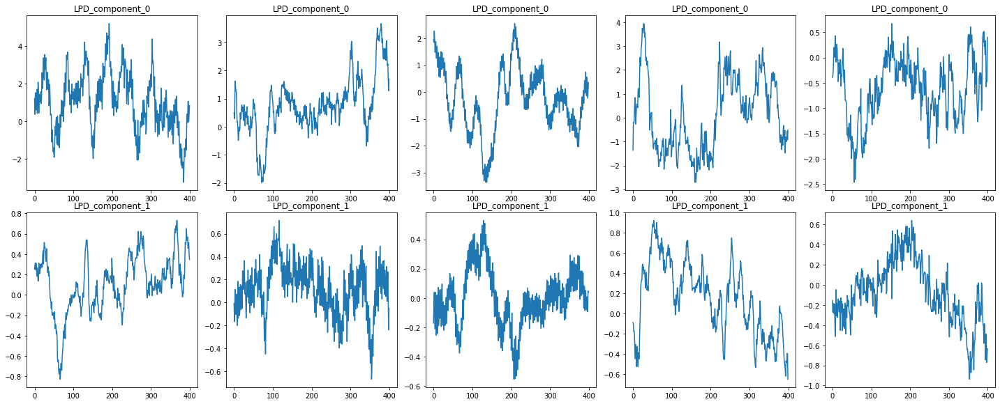

In [35]:
sub_eeg_list = [lpd1_g2q2[0:400], lpd2_g2q2[0:400], lpd3_g2q2[0:400], lpd4_g2q2[0:400], lpd5_g2q2[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

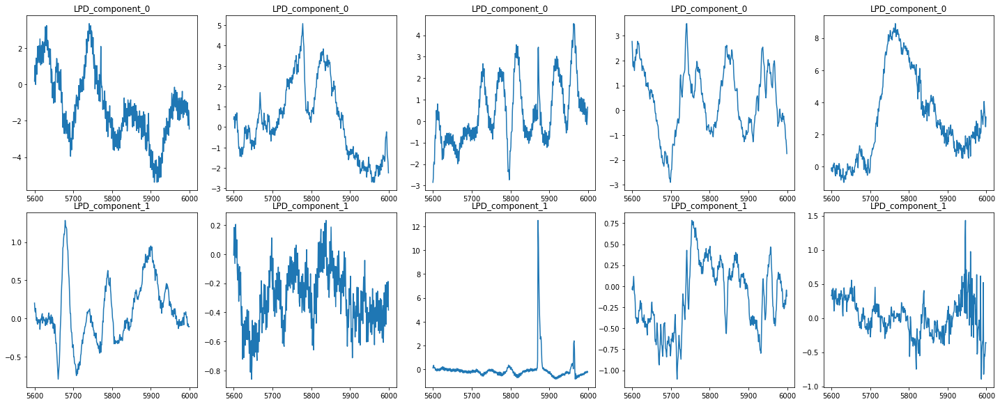

In [36]:
sub_eeg_list = [lpd1_g2q2[5600:6000], lpd2_g2q2[5600:6000], lpd3_g2q2[5600:6000], lpd4_g2q2[5600:6000], 
                lpd5_g2q2[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

##### LPD Q3

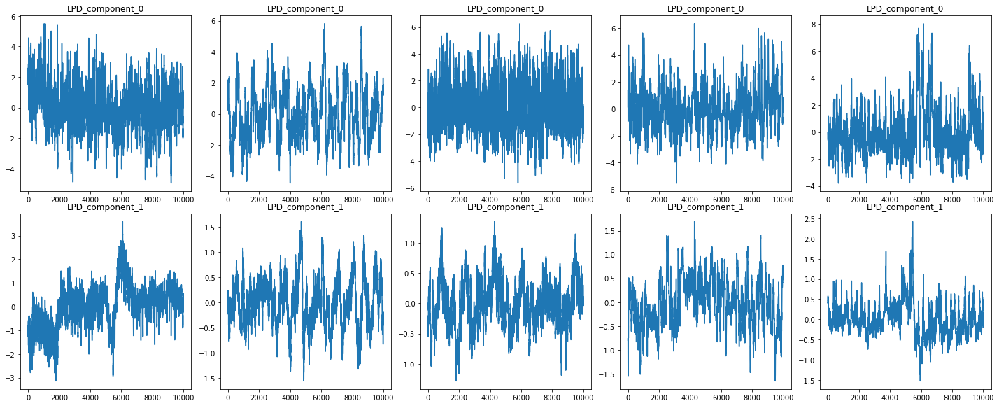

In [37]:
lpd1_g2q3, lpd1_g2q3_ratio = pca_function(scale(lpd_df, lpd_random[0]), group2_q3, 2)
lpd2_g2q3, lpd2_g2q3_ratio = pca_function(scale(lpd_df, lpd_random[1]), group2_q3, 2)
lpd3_g2q3, lpd3_g2q3_ratio = pca_function(scale(lpd_df, lpd_random[2]), group2_q3, 2)
lpd4_g2q3, lpd4_g2q3_ratio = pca_function(scale(lpd_df, lpd_random[3]), group2_q3, 2)
lpd5_g2q3, lpd5_g2q3_ratio = pca_function(scale(lpd_df, lpd_random[4]), group2_q3, 2)

components = lpd1_g2q3.columns

sub_eeg_list = [lpd1_g2q3, lpd2_g2q3, lpd3_g2q3, lpd4_g2q3, lpd5_g2q3]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

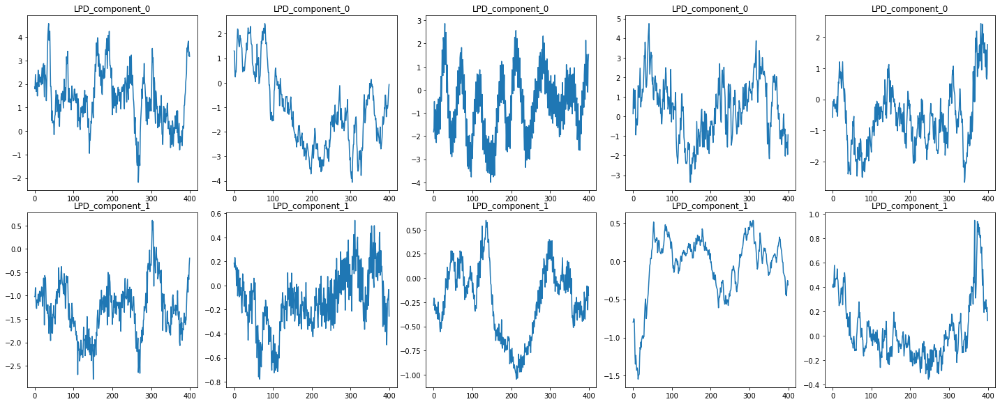

In [38]:
sub_eeg_list = [lpd1_g2q3[0:400], lpd2_g2q3[0:400], lpd3_g2q3[0:400], lpd4_g2q3[0:400], lpd5_g2q3[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

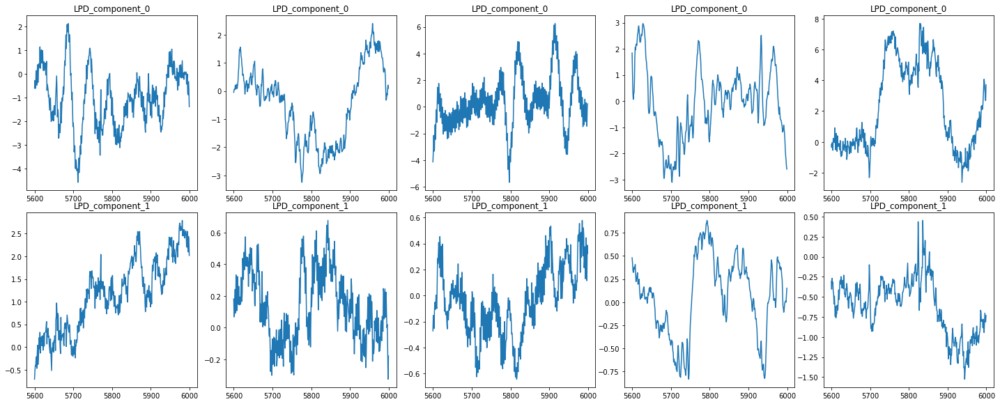

In [39]:
sub_eeg_list = [lpd1_g2q3[5600:6000], lpd2_g2q3[5600:6000], lpd3_g2q3[5600:6000], lpd4_g2q3[5600:6000], 
                lpd5_g2q3[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

##### LPD Q4

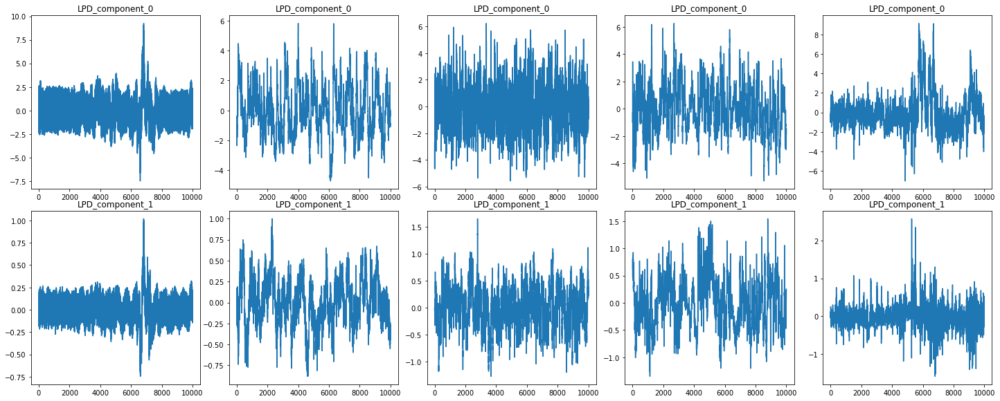

In [40]:
lpd1_g2q4, lpd1_g2q4_ratio = pca_function(scale(lpd_df, lpd_random[0]), group2_q4, 2)
lpd2_g2q4, lpd2_g2q4_ratio = pca_function(scale(lpd_df, lpd_random[1]), group2_q4, 2)
lpd3_g2q4, lpd3_g2q4_ratio = pca_function(scale(lpd_df, lpd_random[2]), group2_q4, 2)
lpd4_g2q4, lpd4_g2q4_ratio = pca_function(scale(lpd_df, lpd_random[3]), group2_q4, 2)
lpd5_g2q4, lpd5_g2q4_ratio = pca_function(scale(lpd_df, lpd_random[4]), group2_q4, 2)

components = lpd1_g2q4.columns

sub_eeg_list = [lpd1_g2q4, lpd2_g2q4, lpd3_g2q4, lpd4_g2q4, lpd5_g2q4]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

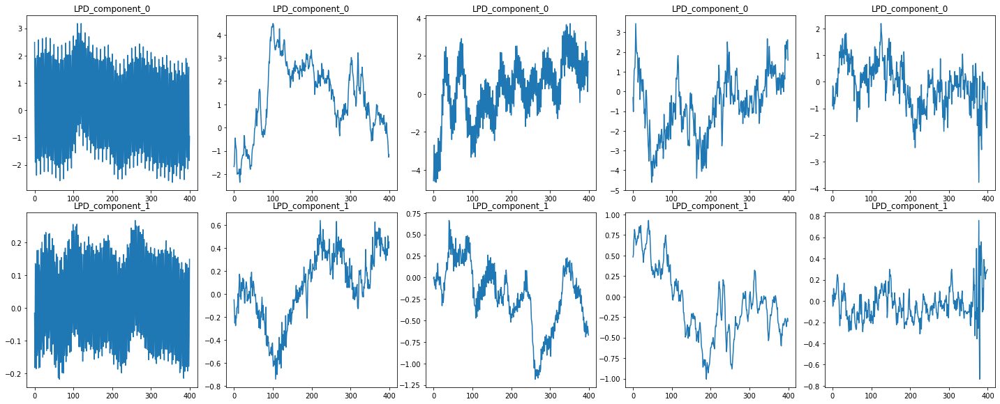

In [41]:
sub_eeg_list = [lpd1_g2q4[0:400], lpd2_g2q4[0:400], lpd3_g2q4[0:400], lpd4_g2q4[0:400], lpd5_g2q4[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

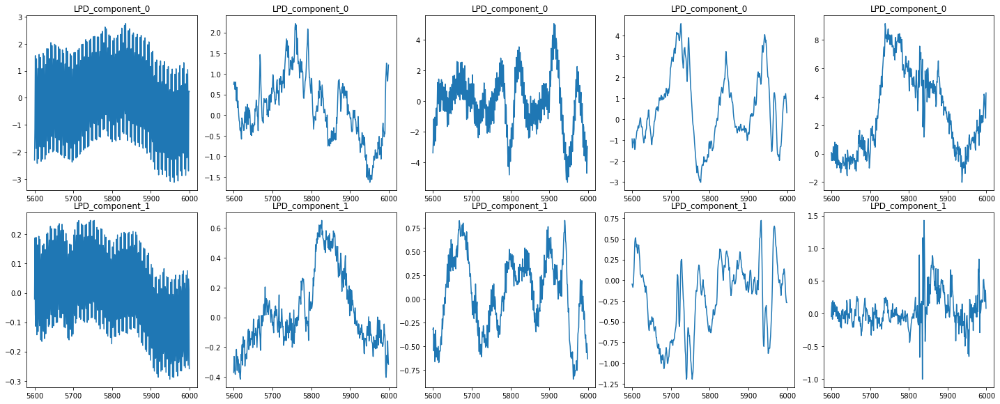

In [42]:
sub_eeg_list = [lpd1_g2q4[5600:6000], lpd2_g2q4[5600:6000], lpd3_g2q4[5600:6000], lpd4_g2q4[5600:6000], 
                lpd5_g2q4[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

##### LPD X

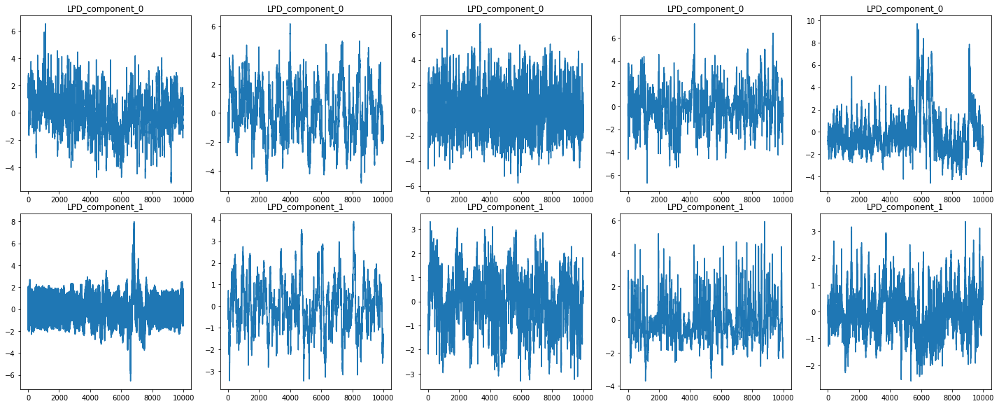

In [43]:
lpd1_g2xaxis, lpd1_g2xaxis_ratio = pca_function(scale(lpd_df, lpd_random[0]), group2_xaxis, 2)
lpd2_g2xaxis, lpd2_g2xaxis_ratio = pca_function(scale(lpd_df, lpd_random[1]), group2_xaxis, 2)
lpd3_g2xaxis, lpd3_g2xaxis_ratio = pca_function(scale(lpd_df, lpd_random[2]), group2_xaxis, 2)
lpd4_g2xaxis, lpd4_g2xaxis_ratio = pca_function(scale(lpd_df, lpd_random[3]), group2_xaxis, 2)
lpd5_g2xaxis, lpd5_g2xaxis_ratio = pca_function(scale(lpd_df, lpd_random[4]), group2_xaxis, 2)

components = lpd1_g2xaxis.columns

sub_eeg_list = [lpd1_g2xaxis, lpd2_g2xaxis, lpd3_g2xaxis, lpd4_g2xaxis, lpd5_g2xaxis]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

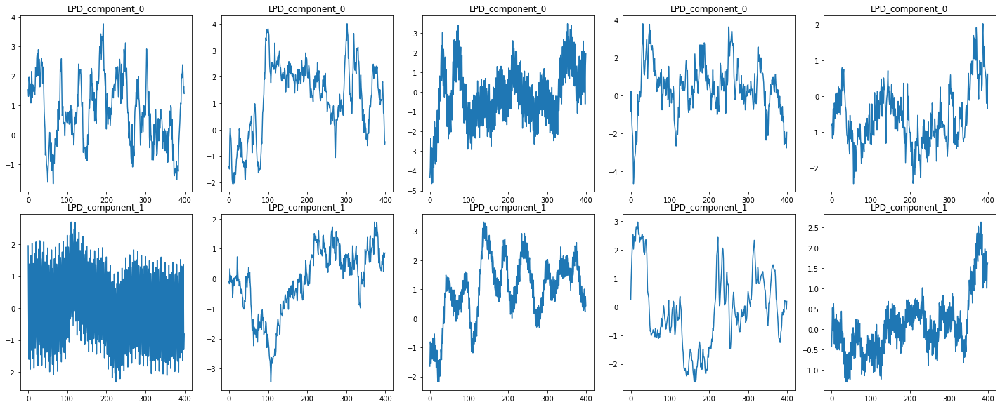

In [44]:
sub_eeg_list = [lpd1_g2xaxis[0:400], lpd2_g2xaxis[0:400], lpd3_g2xaxis[0:400], lpd4_g2xaxis[0:400], lpd5_g2xaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

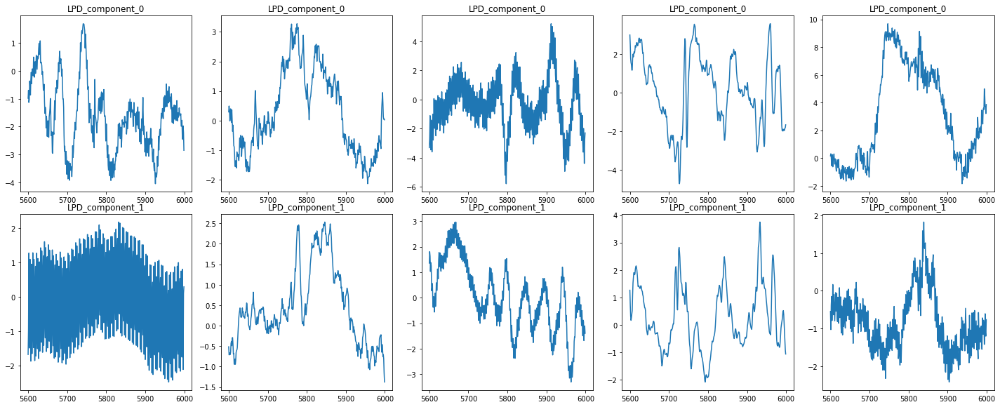

In [45]:
sub_eeg_list = [lpd1_g2xaxis[5600:6000], lpd2_g2xaxis[5600:6000], lpd3_g2xaxis[5600:6000], lpd4_g2xaxis[5600:6000], 
                lpd5_g2xaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

##### LPD Y

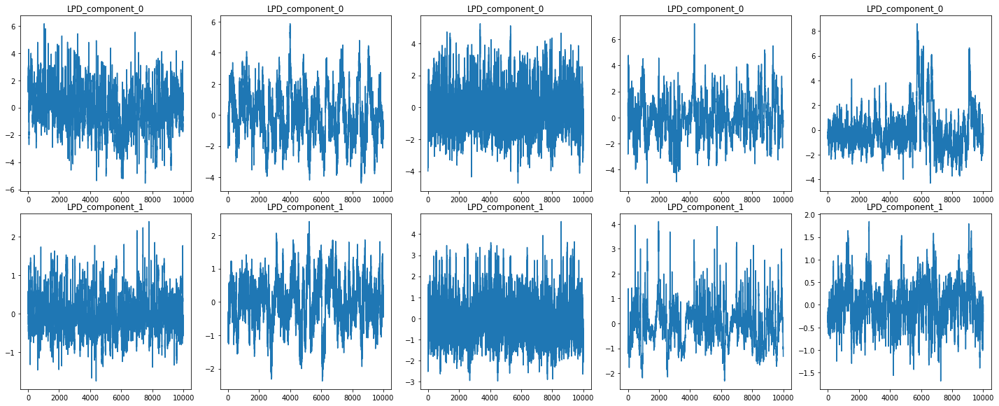

In [46]:
lpd1_g2yaxis, lpd1_g2yaxis_ratio = pca_function(scale(lpd_df, lpd_random[0]), group2_yaxis, 2)
lpd2_g2yaxis, lpd2_g2yaxis_ratio = pca_function(scale(lpd_df, lpd_random[1]), group2_yaxis, 2)
lpd3_g2yaxis, lpd3_g2yaxis_ratio = pca_function(scale(lpd_df, lpd_random[2]), group2_yaxis, 2)
lpd4_g2yaxis, lpd4_g2yaxis_ratio = pca_function(scale(lpd_df, lpd_random[3]), group2_yaxis, 2)
lpd5_g2yaxis, lpd5_g2yaxis_ratio = pca_function(scale(lpd_df, lpd_random[4]), group2_yaxis, 2)

components = lpd1_g2yaxis.columns

sub_eeg_list = [lpd1_g2yaxis, lpd2_g2yaxis, lpd3_g2yaxis, lpd4_g2yaxis, lpd5_g2yaxis]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

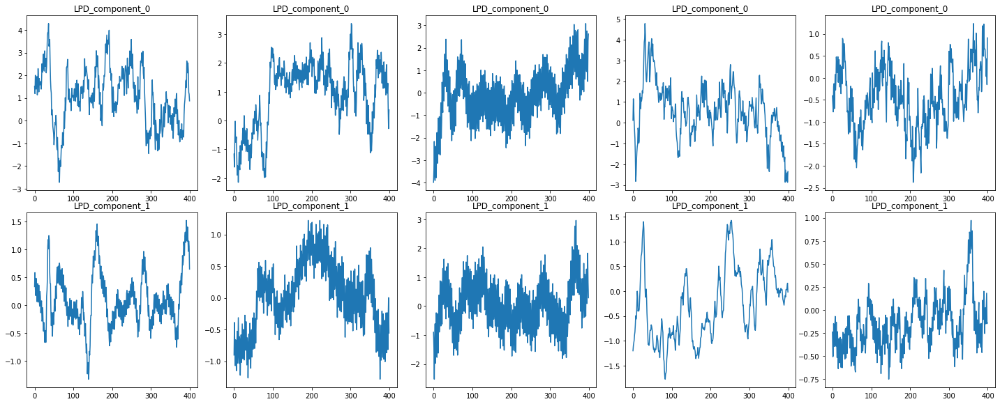

In [47]:
sub_eeg_list = [lpd1_g2yaxis[0:400], lpd2_g2yaxis[0:400], lpd3_g2yaxis[0:400], lpd4_g2yaxis[0:400], lpd5_g2yaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

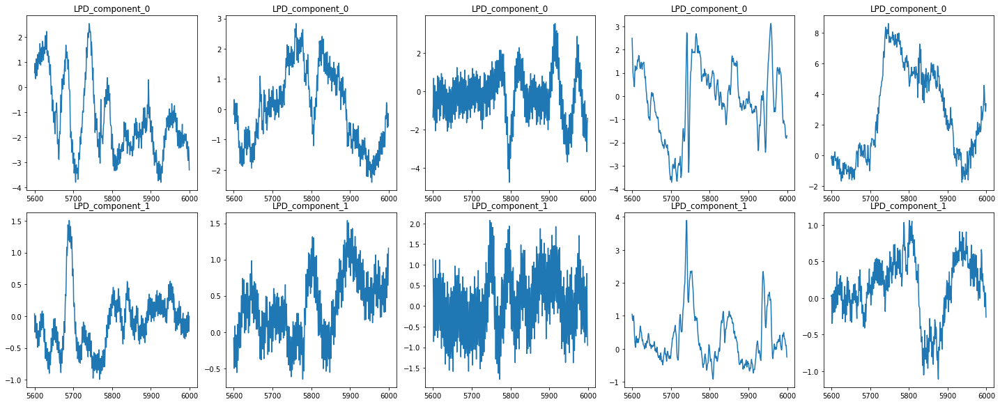

In [48]:
sub_eeg_list = [lpd1_g2yaxis[5600:6000], lpd2_g2yaxis[5600:6000], lpd3_g2yaxis[5600:6000], lpd4_g2yaxis[5600:6000], 
                lpd5_g2yaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 8, 20)

##### GPD Q1

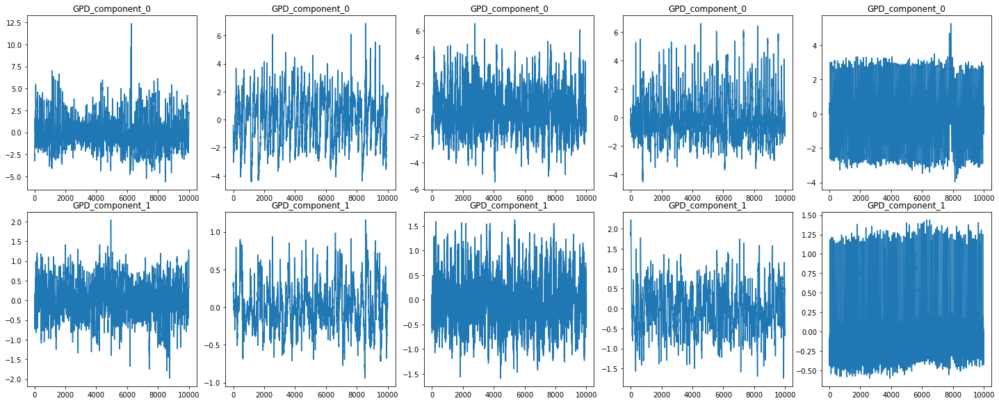

In [49]:
gpd1_g2q1, gpd1_g2q1_ratio = pca_function(scale(gpd_df, gpd_random[0]), group2_q1, 2)
gpd2_g2q1, gpd2_g2q1_ratio = pca_function(scale(gpd_df, gpd_random[1]), group2_q1, 2)
gpd3_g2q1, gpd3_g2q1_ratio = pca_function(scale(gpd_df, gpd_random[2]), group2_q1, 2)
gpd4_g2q1, gpd4_g2q1_ratio = pca_function(scale(gpd_df, gpd_random[3]), group2_q1, 2)
gpd5_g2q1, gpd5_g2q1_ratio = pca_function(scale(gpd_df, gpd_random[4]), group2_q1, 2)

components = gpd1_g2q1.columns

sub_eeg_list = [gpd1_g2q1, gpd2_g2q1, gpd3_g2q1, gpd4_g2q1, gpd5_g2q1]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

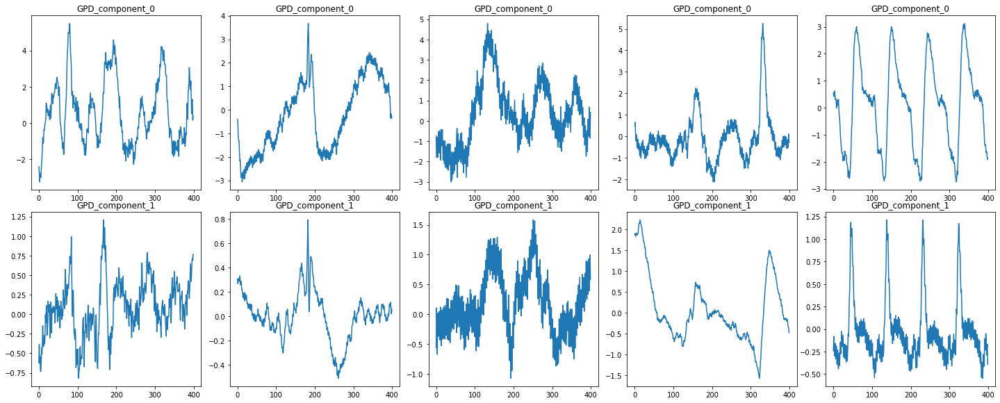

In [50]:
sub_eeg_list = [gpd1_g2q1[0:400], gpd2_g2q1[0:400], gpd3_g2q1[0:400], gpd4_g2q1[0:400], gpd5_g2q1[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

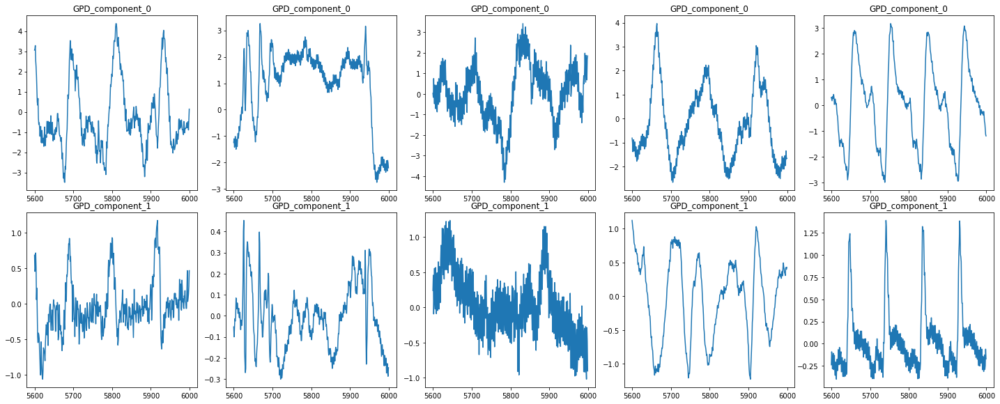

In [51]:
sub_eeg_list = [gpd1_g2q1[5600:6000], gpd2_g2q1[5600:6000], gpd3_g2q1[5600:6000], gpd4_g2q1[5600:6000], 
                gpd5_g2q1[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

##### GPD Q2

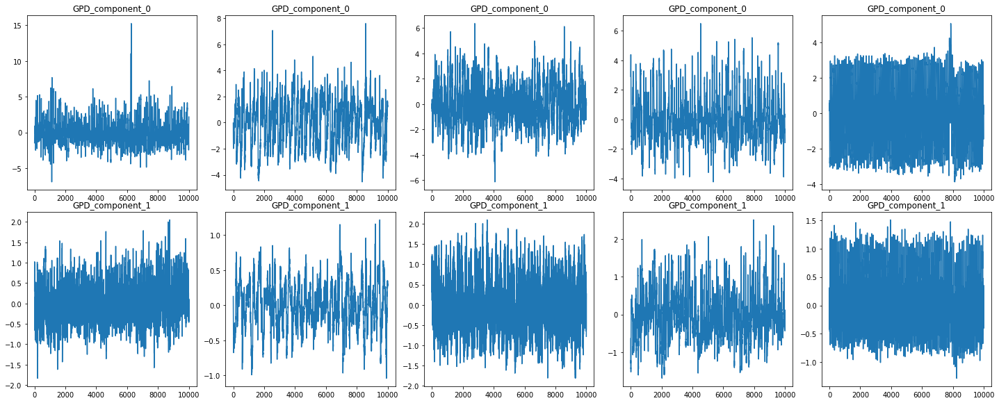

In [52]:
gpd1_g2q2, gpd1_g2q2_ratio = pca_function(scale(gpd_df, gpd_random[0]), group2_q2, 2)
gpd2_g2q2, gpd2_g2q2_ratio = pca_function(scale(gpd_df, gpd_random[1]), group2_q2, 2)
gpd3_g2q2, gpd3_g2q2_ratio = pca_function(scale(gpd_df, gpd_random[2]), group2_q2, 2)
gpd4_g2q2, gpd4_g2q2_ratio = pca_function(scale(gpd_df, gpd_random[3]), group2_q2, 2)
gpd5_g2q2, gpd5_g2q2_ratio = pca_function(scale(gpd_df, gpd_random[4]), group2_q2, 2)

components = gpd1_g2q2.columns

sub_eeg_list = [gpd1_g2q2, gpd2_g2q2, gpd3_g2q2, gpd4_g2q2, gpd5_g2q2]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

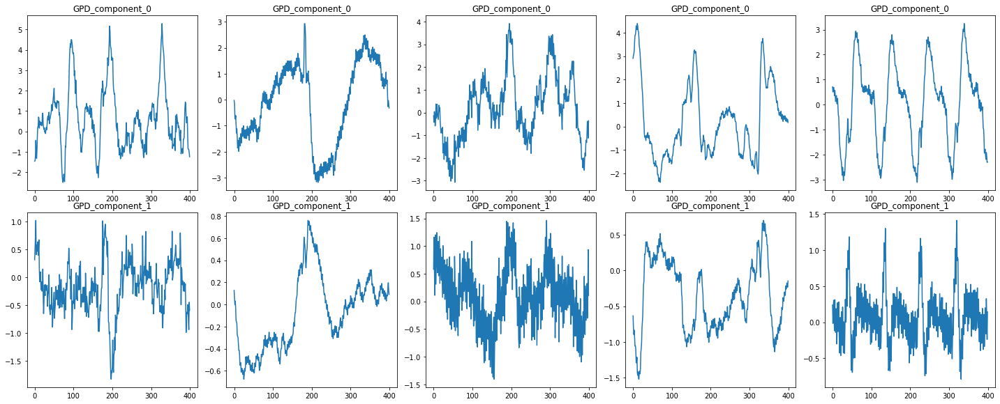

In [53]:
sub_eeg_list = [gpd1_g2q2[0:400], gpd2_g2q2[0:400], gpd3_g2q2[0:400], gpd4_g2q2[0:400], gpd5_g2q2[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

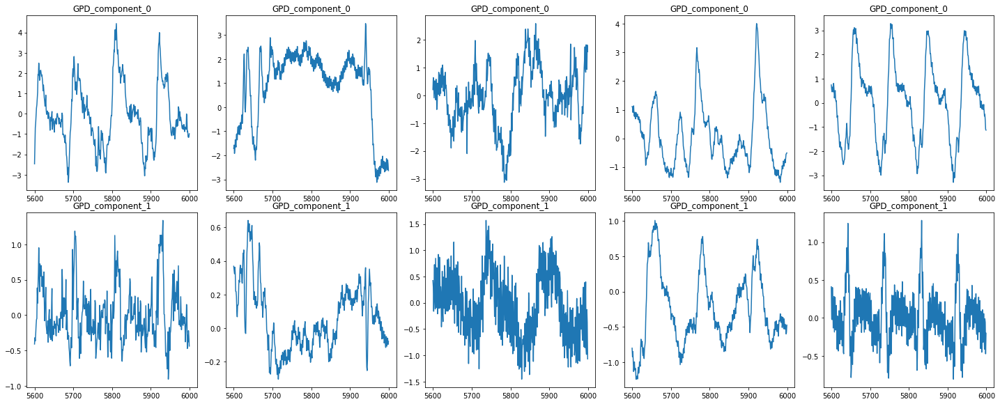

In [54]:
sub_eeg_list = [gpd1_g2q2[5600:6000], gpd2_g2q2[5600:6000], gpd3_g2q2[5600:6000], gpd4_g2q2[5600:6000], 
                gpd5_g2q2[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

##### GPD Q3

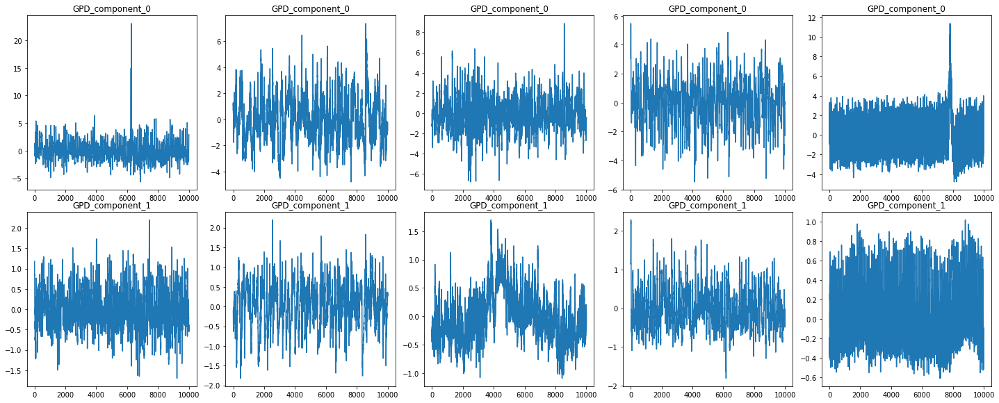

In [55]:
gpd1_g2q3, gpd1_g2q3_ratio = pca_function(scale(gpd_df, gpd_random[0]), group2_q3, 2)
gpd2_g2q3, gpd2_g2q3_ratio = pca_function(scale(gpd_df, gpd_random[1]), group2_q3, 2)
gpd3_g2q3, gpd3_g2q3_ratio = pca_function(scale(gpd_df, gpd_random[2]), group2_q3, 2)
gpd4_g2q3, gpd4_g2q3_ratio = pca_function(scale(gpd_df, gpd_random[3]), group2_q3, 2)
gpd5_g2q3, gpd5_g2q3_ratio = pca_function(scale(gpd_df, gpd_random[4]), group2_q3, 2)

components = gpd1_g2q3.columns

sub_eeg_list = [gpd1_g2q3, gpd2_g2q3, gpd3_g2q3, gpd4_g2q3, gpd5_g2q3]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

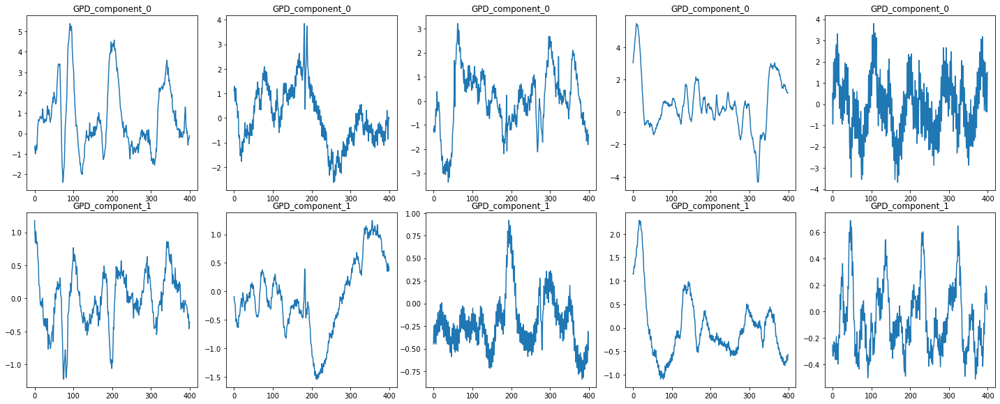

In [56]:
sub_eeg_list = [gpd1_g2q3[0:400], gpd2_g2q3[0:400], gpd3_g2q3[0:400], gpd4_g2q3[0:400], gpd5_g2q3[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

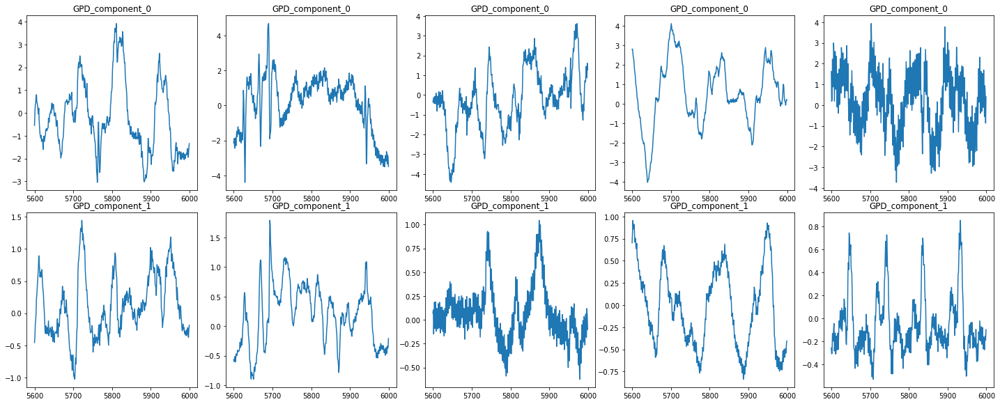

In [57]:
sub_eeg_list = [gpd1_g2q3[5600:6000], gpd2_g2q3[5600:6000], gpd3_g2q3[5600:6000], gpd4_g2q3[5600:6000], 
                gpd5_g2q3[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

##### GPD Q4

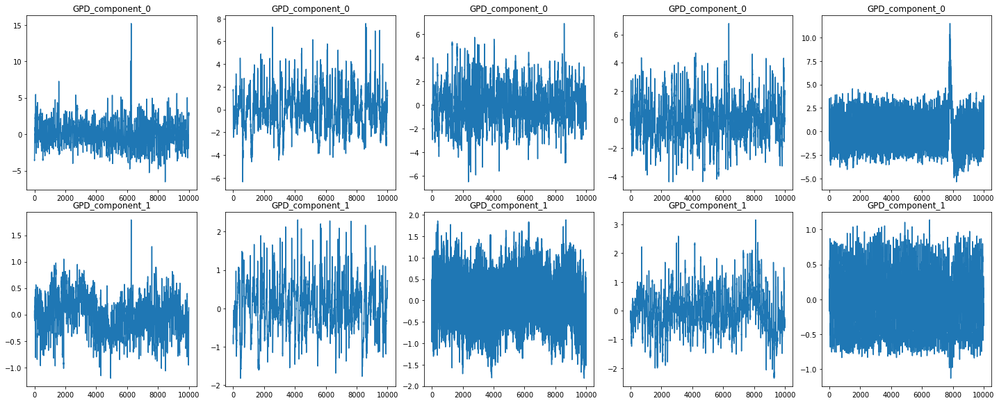

In [58]:
gpd1_g2q4, gpd1_g2q4_ratio = pca_function(scale(gpd_df, gpd_random[0]), group2_q4, 2)
gpd2_g2q4, gpd2_g2q4_ratio = pca_function(scale(gpd_df, gpd_random[1]), group2_q4, 2)
gpd3_g2q4, gpd3_g2q4_ratio = pca_function(scale(gpd_df, gpd_random[2]), group2_q4, 2)
gpd4_g2q4, gpd4_g2q4_ratio = pca_function(scale(gpd_df, gpd_random[3]), group2_q4, 2)
gpd5_g2q4, gpd5_g2q4_ratio = pca_function(scale(gpd_df, gpd_random[4]), group2_q4, 2)

components = gpd1_g2q4.columns

sub_eeg_list = [gpd1_g2q4, gpd2_g2q4, gpd3_g2q4, gpd4_g2q4, gpd5_g2q4]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

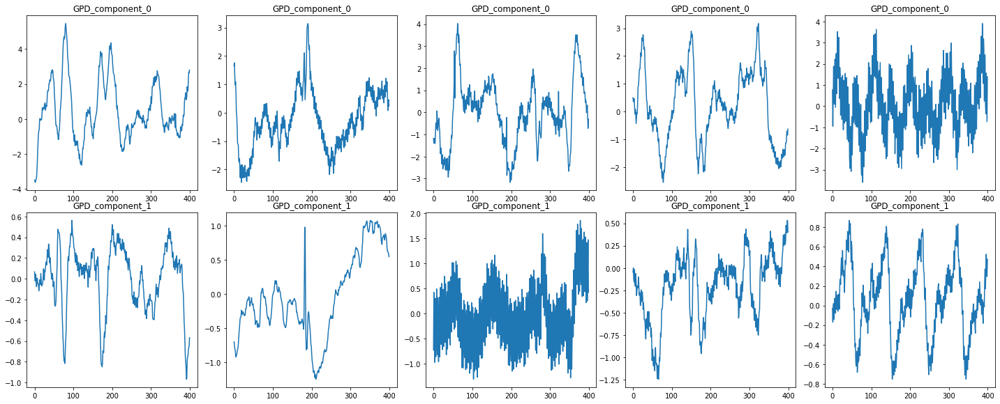

In [59]:
sub_eeg_list = [gpd1_g2q4[0:400], gpd2_g2q4[0:400], gpd3_g2q4[0:400], gpd4_g2q4[0:400], gpd5_g2q4[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

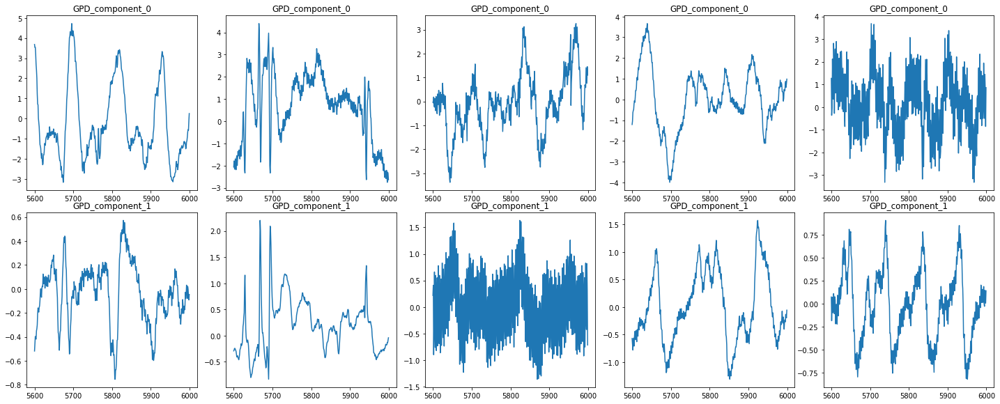

In [60]:
sub_eeg_list = [gpd1_g2q4[5600:6000], gpd2_g2q4[5600:6000], gpd3_g2q4[5600:6000], gpd4_g2q4[5600:6000], 
                gpd5_g2q4[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

##### GPD X

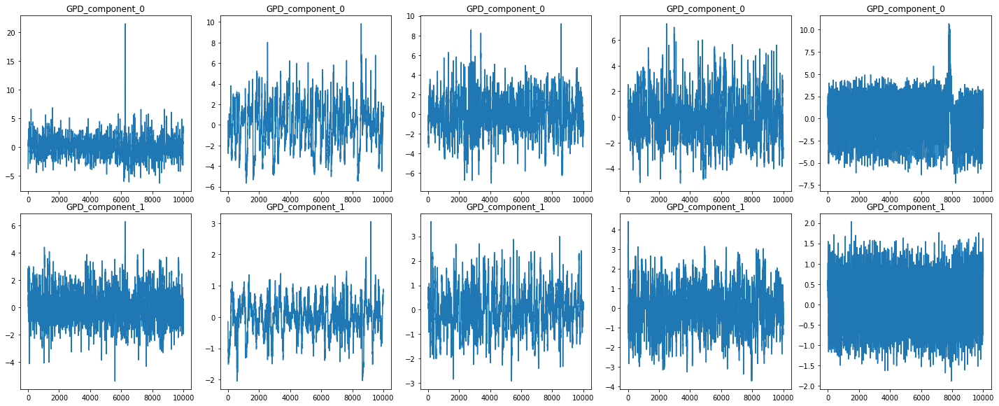

In [61]:
gpd1_g2xaxis, gpd1_g2xaxis_ratio = pca_function(scale(gpd_df, gpd_random[0]), group2_xaxis, 2)
gpd2_g2xaxis, gpd2_g2xaxis_ratio = pca_function(scale(gpd_df, gpd_random[1]), group2_xaxis, 2)
gpd3_g2xaxis, gpd3_g2xaxis_ratio = pca_function(scale(gpd_df, gpd_random[2]), group2_xaxis, 2)
gpd4_g2xaxis, gpd4_g2xaxis_ratio = pca_function(scale(gpd_df, gpd_random[3]), group2_xaxis, 2)
gpd5_g2xaxis, gpd5_g2xaxis_ratio = pca_function(scale(gpd_df, gpd_random[4]), group2_xaxis, 2)

components = gpd1_g2xaxis.columns

sub_eeg_list = [gpd1_g2xaxis, gpd2_g2xaxis, gpd3_g2xaxis, gpd4_g2xaxis, gpd5_g2xaxis]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

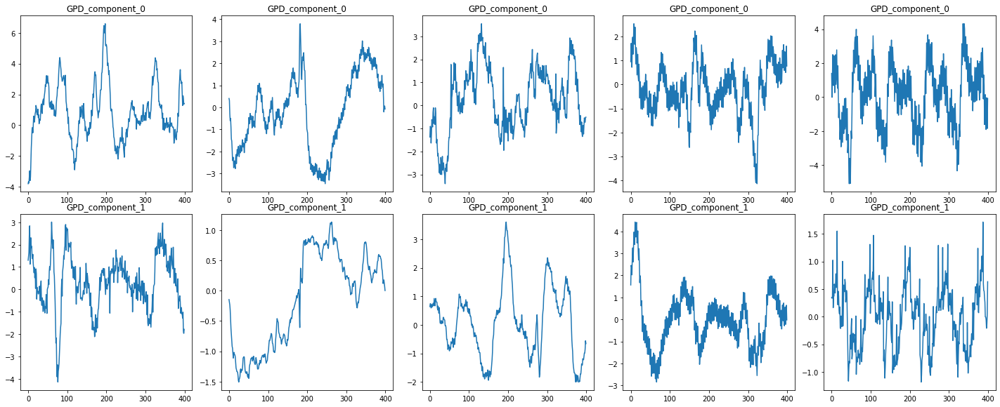

In [62]:
sub_eeg_list = [gpd1_g2xaxis[0:400], gpd2_g2xaxis[0:400], gpd3_g2xaxis[0:400], gpd4_g2xaxis[0:400], gpd5_g2xaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

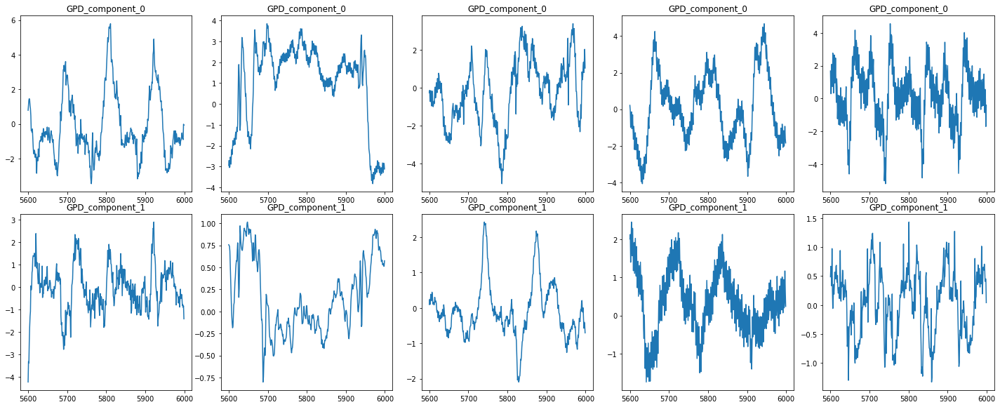

In [63]:
sub_eeg_list = [gpd1_g2xaxis[5600:6000], gpd2_g2xaxis[5600:6000], gpd3_g2xaxis[5600:6000], gpd4_g2xaxis[5600:6000], 
                gpd5_g2xaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

##### GPD Y

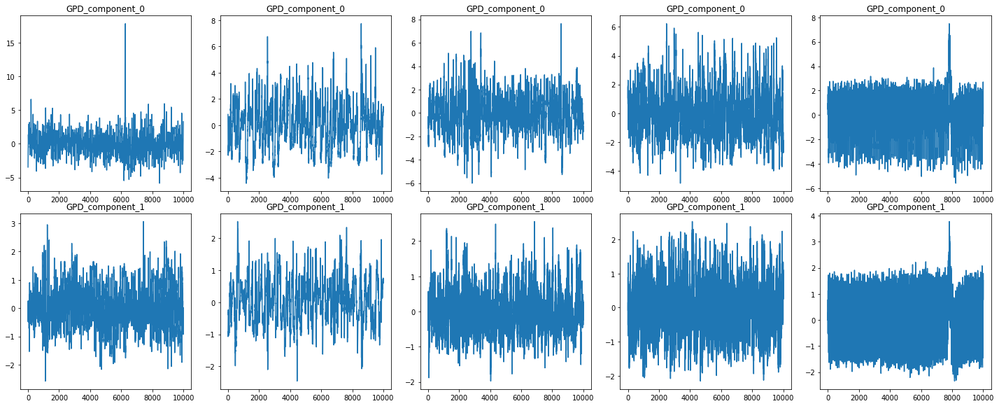

In [64]:
gpd1_g2yaxis, gpd1_g2yaxis_ratio = pca_function(scale(gpd_df, gpd_random[0]), group2_yaxis, 2)
gpd2_g2yaxis, gpd2_g2yaxis_ratio = pca_function(scale(gpd_df, gpd_random[1]), group2_yaxis, 2)
gpd3_g2yaxis, gpd3_g2yaxis_ratio = pca_function(scale(gpd_df, gpd_random[2]), group2_yaxis, 2)
gpd4_g2yaxis, gpd4_g2yaxis_ratio = pca_function(scale(gpd_df, gpd_random[3]), group2_yaxis, 2)
gpd5_g2yaxis, gpd5_g2yaxis_ratio = pca_function(scale(gpd_df, gpd_random[4]), group2_yaxis, 2)

components = gpd1_g2yaxis.columns

sub_eeg_list = [gpd1_g2yaxis, gpd2_g2yaxis, gpd3_g2yaxis, gpd4_g2yaxis, gpd5_g2yaxis]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

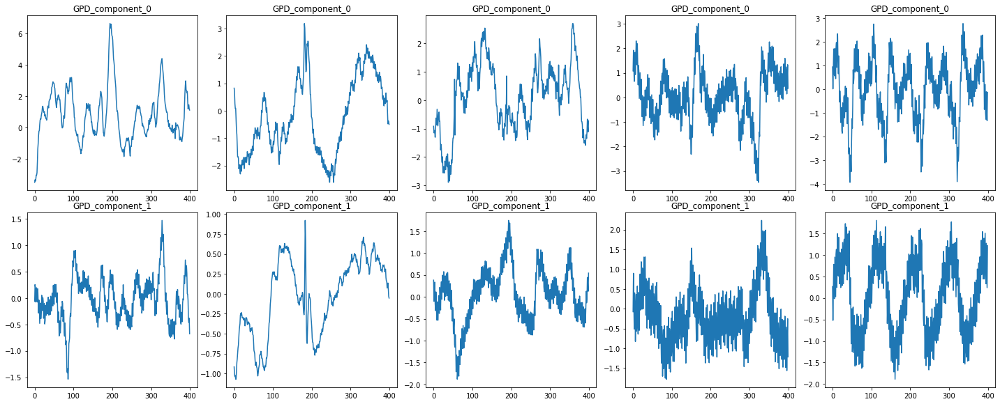

In [65]:
sub_eeg_list = [gpd1_g2yaxis[0:400], gpd2_g2yaxis[0:400], gpd3_g2yaxis[0:400], gpd4_g2yaxis[0:400], gpd5_g2yaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

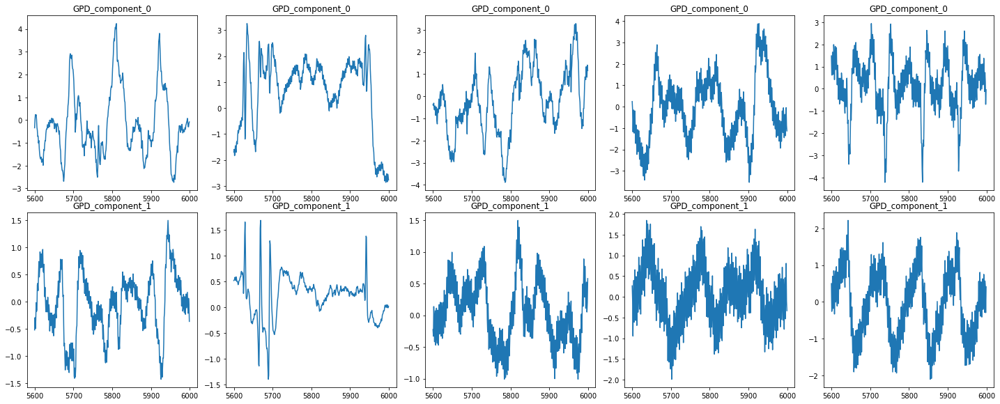

In [66]:
sub_eeg_list = [gpd1_g2yaxis[5600:6000], gpd2_g2yaxis[5600:6000], gpd3_g2yaxis[5600:6000], gpd4_g2yaxis[5600:6000], 
                gpd5_g2yaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 8, 20)

##### LRDA Q1

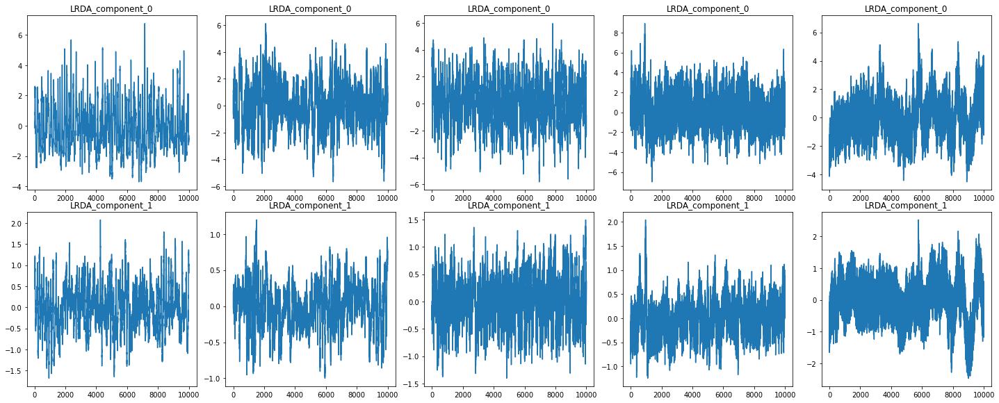

In [67]:
lrda1_g2q1, lrda1_g2q1_ratio = pca_function(scale(lrda_df, lrda_random[0]), group2_q1, 2)
lrda2_g2q1, lrda2_g2q1_ratio = pca_function(scale(lrda_df, lrda_random[1]), group2_q1, 2)
lrda3_g2q1, lrda3_g2q1_ratio = pca_function(scale(lrda_df, lrda_random[2]), group2_q1, 2)
lrda4_g2q1, lrda4_g2q1_ratio = pca_function(scale(lrda_df, lrda_random[3]), group2_q1, 2)
lrda5_g2q1, lrda5_g2q1_ratio = pca_function(scale(lrda_df, lrda_random[4]), group2_q1, 2)

components = lrda1_g2q1.columns

sub_eeg_list = [lrda1_g2q1, lrda2_g2q1, lrda3_g2q1, lrda4_g2q1, lrda5_g2q1]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

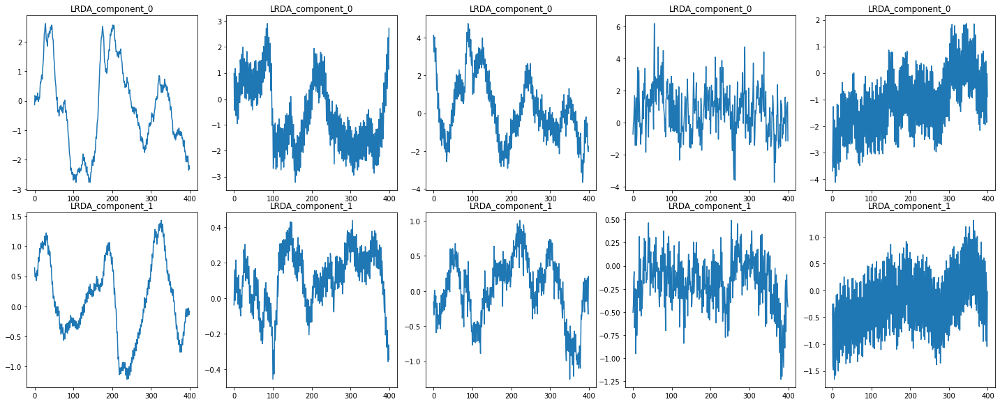

In [68]:
sub_eeg_list = [lrda1_g2q1[0:400], lrda2_g2q1[0:400], lrda3_g2q1[0:400], lrda4_g2q1[0:400], lrda5_g2q1[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

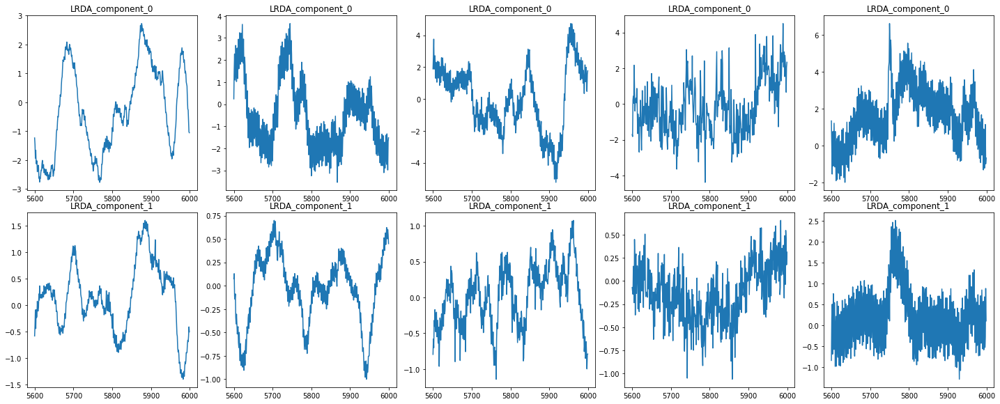

In [69]:
sub_eeg_list = [lrda1_g2q1[5600:6000], lrda2_g2q1[5600:6000], lrda3_g2q1[5600:6000], lrda4_g2q1[5600:6000], lrda5_g2q1[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

##### LRDA Q2

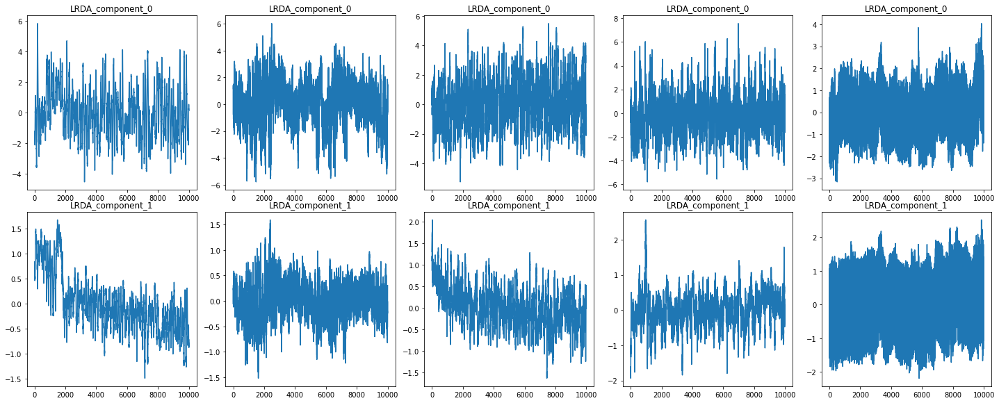

In [70]:
lrda1_g2q2, lrda1_g2q2_ratio = pca_function(scale(lrda_df, lrda_random[0]), group2_q2, 2)
lrda2_g2q2, lrda2_g2q2_ratio = pca_function(scale(lrda_df, lrda_random[1]), group2_q2, 2)
lrda3_g2q2, lrda3_g2q2_ratio = pca_function(scale(lrda_df, lrda_random[2]), group2_q2, 2)
lrda4_g2q2, lrda4_g2q2_ratio = pca_function(scale(lrda_df, lrda_random[3]), group2_q2, 2)
lrda5_g2q2, lrda5_g2q2_ratio = pca_function(scale(lrda_df, lrda_random[4]), group2_q2, 2)

components = lrda1_g2q2.columns

sub_eeg_list = [lrda1_g2q2, lrda2_g2q2, lrda3_g2q2, lrda4_g2q2, lrda5_g2q2]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

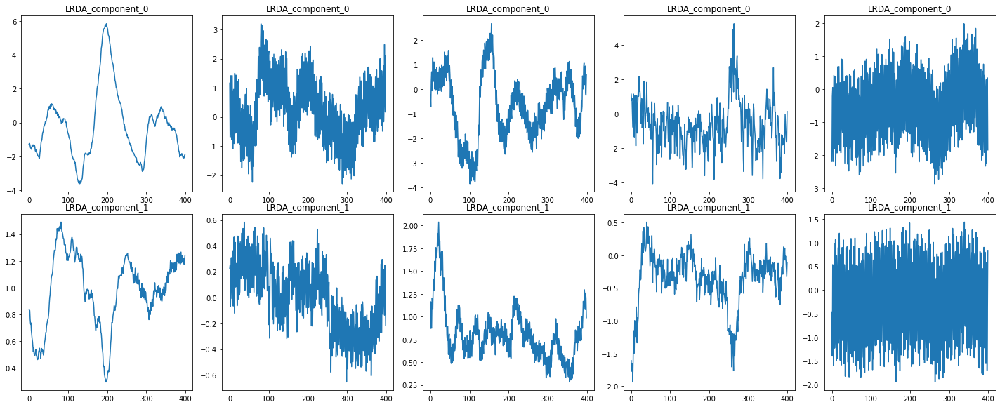

In [71]:
sub_eeg_list = [lrda1_g2q2[0:400], lrda2_g2q2[0:400], lrda3_g2q2[0:400], lrda4_g2q2[0:400], lrda5_g2q2[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

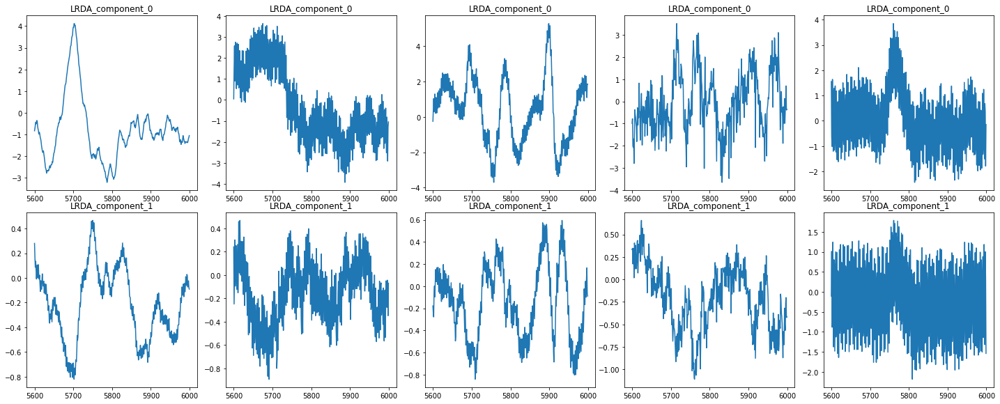

In [72]:
sub_eeg_list = [lrda1_g2q2[5600:6000], lrda2_g2q2[5600:6000], lrda3_g2q2[5600:6000], lrda4_g2q2[5600:6000], lrda5_g2q2[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

##### LRDA Q3

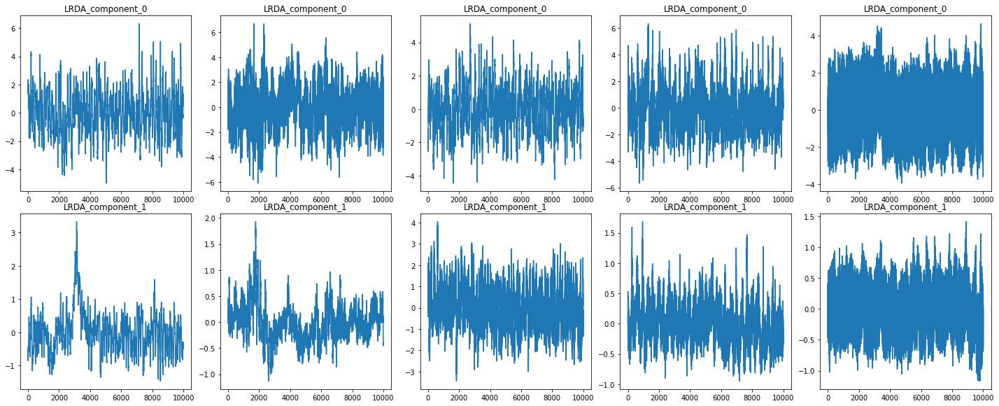

In [73]:
lrda1_g2q3, lrda1_g2q3_ratio = pca_function(scale(lrda_df, lrda_random[0]), group2_q3, 2)
lrda2_g2q3, lrda2_g2q3_ratio = pca_function(scale(lrda_df, lrda_random[1]), group2_q3, 2)
lrda3_g2q3, lrda3_g2q3_ratio = pca_function(scale(lrda_df, lrda_random[2]), group2_q3, 2)
lrda4_g2q3, lrda4_g2q3_ratio = pca_function(scale(lrda_df, lrda_random[3]), group2_q3, 2)
lrda5_g2q3, lrda5_g2q3_ratio = pca_function(scale(lrda_df, lrda_random[4]), group2_q3, 2)

components = lrda1_g2q3.columns

sub_eeg_list = [lrda1_g2q3, lrda2_g2q3, lrda3_g2q3, lrda4_g2q3, lrda5_g2q3]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

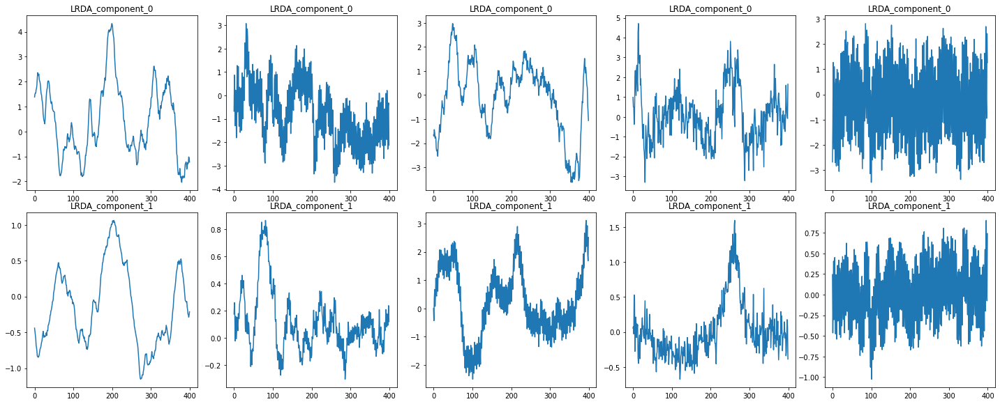

In [74]:
sub_eeg_list = [lrda1_g2q3[0:400], lrda2_g2q3[0:400], lrda3_g2q3[0:400], lrda4_g2q3[0:400], lrda5_g2q3[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

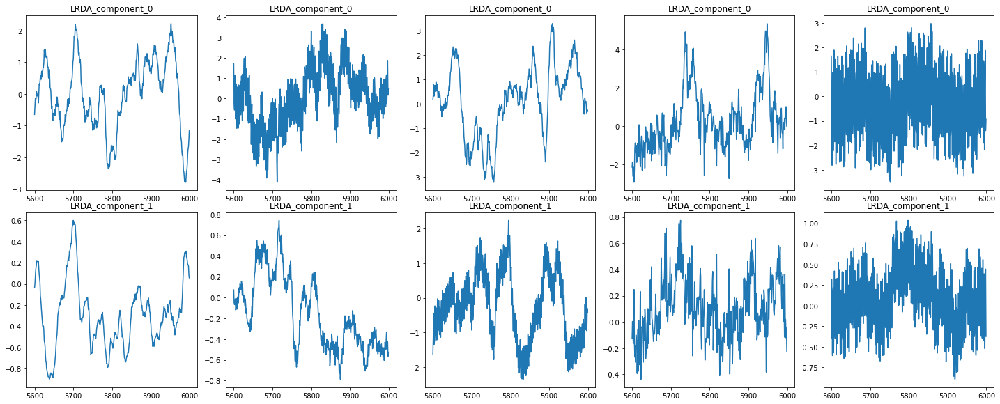

In [75]:
sub_eeg_list = [lrda1_g2q3[5600:6000], lrda2_g2q3[5600:6000], lrda3_g2q3[5600:6000], lrda4_g2q3[5600:6000], lrda5_g2q3[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

##### LRDA Q4

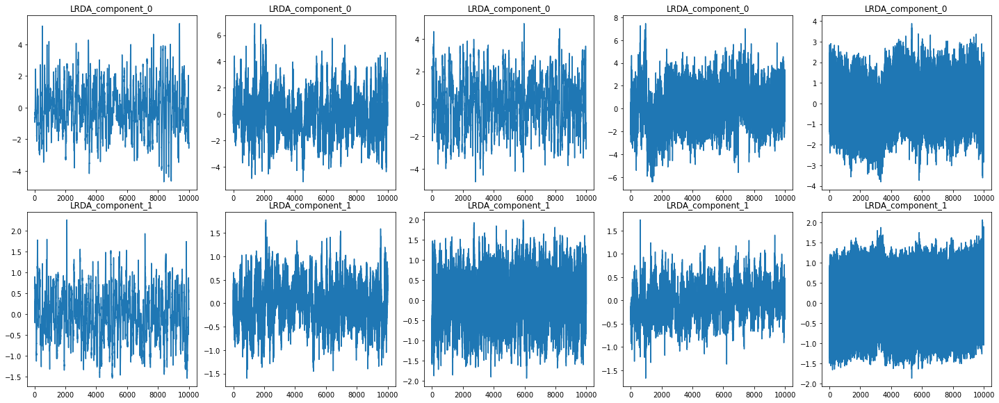

In [76]:
lrda1_g2q4, lrda1_g2q4_ratio = pca_function(scale(lrda_df, lrda_random[0]), group2_q4, 2)
lrda2_g2q4, lrda2_g2q4_ratio = pca_function(scale(lrda_df, lrda_random[1]), group2_q4, 2)
lrda3_g2q4, lrda3_g2q4_ratio = pca_function(scale(lrda_df, lrda_random[2]), group2_q4, 2)
lrda4_g2q4, lrda4_g2q4_ratio = pca_function(scale(lrda_df, lrda_random[3]), group2_q4, 2)
lrda5_g2q4, lrda5_g2q4_ratio = pca_function(scale(lrda_df, lrda_random[4]), group2_q4, 2)

components = lrda1_g2q4.columns

sub_eeg_list = [lrda1_g2q4, lrda2_g2q4, lrda3_g2q4, lrda4_g2q4, lrda5_g2q4]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

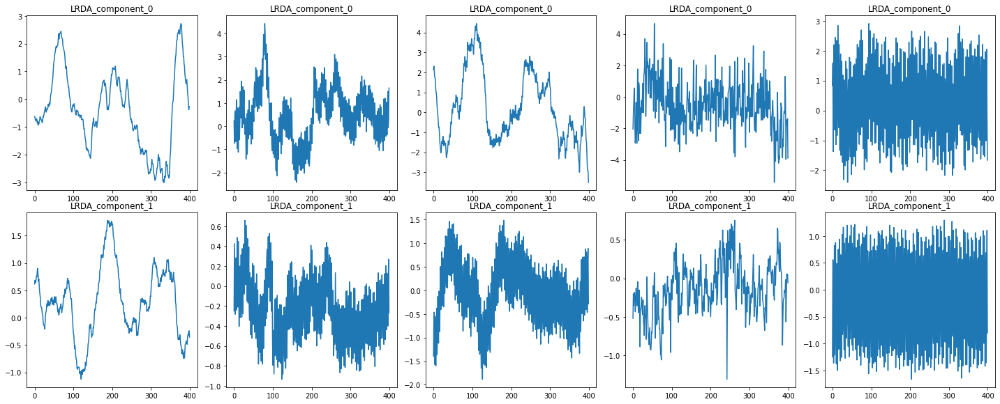

In [77]:
sub_eeg_list = [lrda1_g2q4[0:400], lrda2_g2q4[0:400], lrda3_g2q4[0:400], lrda4_g2q4[0:400], lrda5_g2q4[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

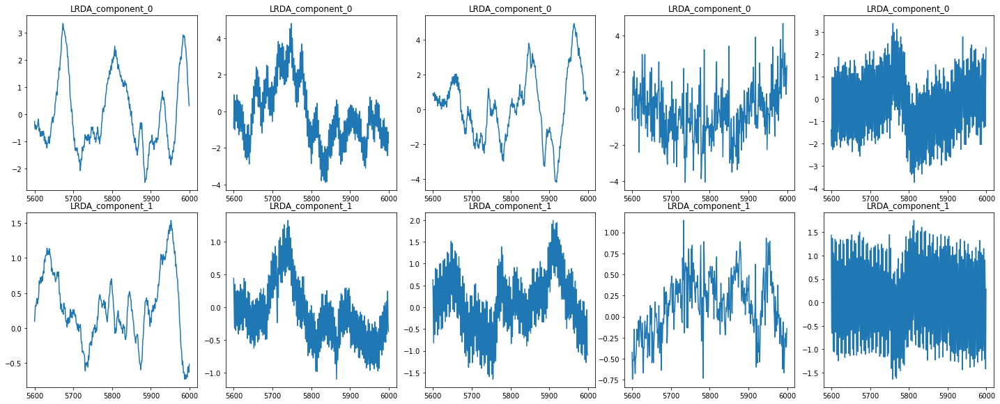

In [78]:
sub_eeg_list = [lrda1_g2q4[5600:6000], lrda2_g2q4[5600:6000], lrda3_g2q4[5600:6000], lrda4_g2q4[5600:6000], lrda5_g2q4[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

##### LRDA X

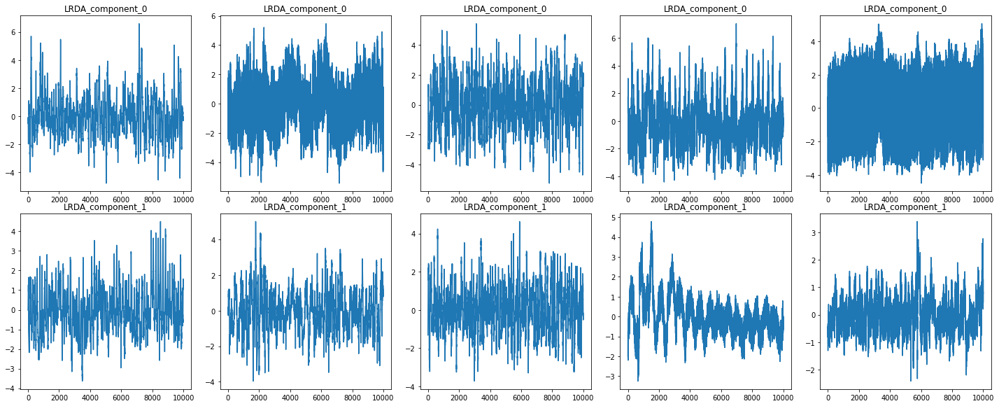

In [79]:
lrda1_g2xaxis, lrda1_g2xaxis_ratio = pca_function(scale(lrda_df, lrda_random[0]), group2_xaxis, 2)
lrda2_g2xaxis, lrda2_g2xaxis_ratio = pca_function(scale(lrda_df, lrda_random[1]), group2_xaxis, 2)
lrda3_g2xaxis, lrda3_g2xaxis_ratio = pca_function(scale(lrda_df, lrda_random[2]), group2_xaxis, 2)
lrda4_g2xaxis, lrda4_g2xaxis_ratio = pca_function(scale(lrda_df, lrda_random[3]), group2_xaxis, 2)
lrda5_g2xaxis, lrda5_g2xaxis_ratio = pca_function(scale(lrda_df, lrda_random[4]), group2_xaxis, 2)

components = lrda1_g2xaxis.columns

sub_eeg_list = [lrda1_g2xaxis, lrda2_g2xaxis, lrda3_g2xaxis, lrda4_g2xaxis, lrda5_g2xaxis]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

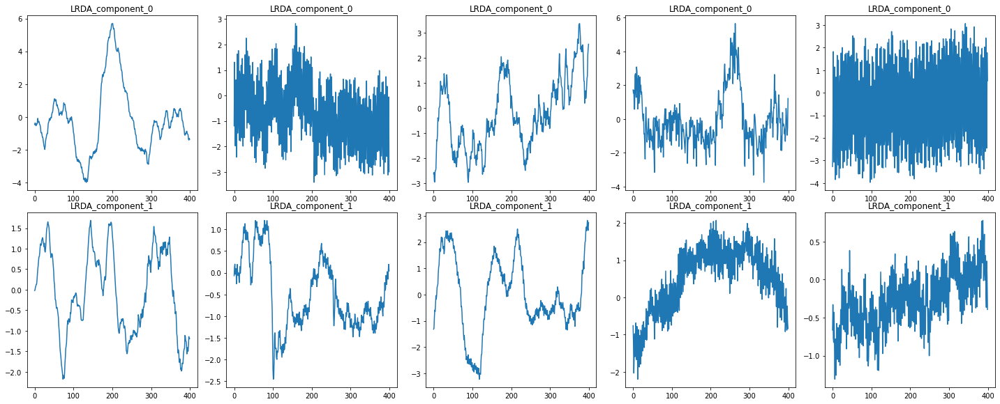

In [80]:
sub_eeg_list = [lrda1_g2xaxis[0:400], lrda2_g2xaxis[0:400], lrda3_g2xaxis[0:400], lrda4_g2xaxis[0:400], lrda5_g2xaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

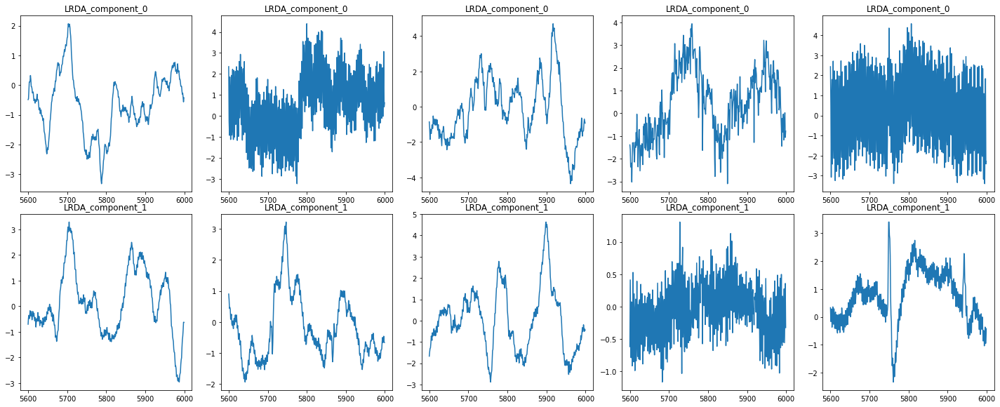

In [81]:
sub_eeg_list = [lrda1_g2xaxis[5600:6000], lrda2_g2xaxis[5600:6000], lrda3_g2xaxis[5600:6000], lrda4_g2xaxis[5600:6000], lrda5_g2xaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

##### LRDA Y

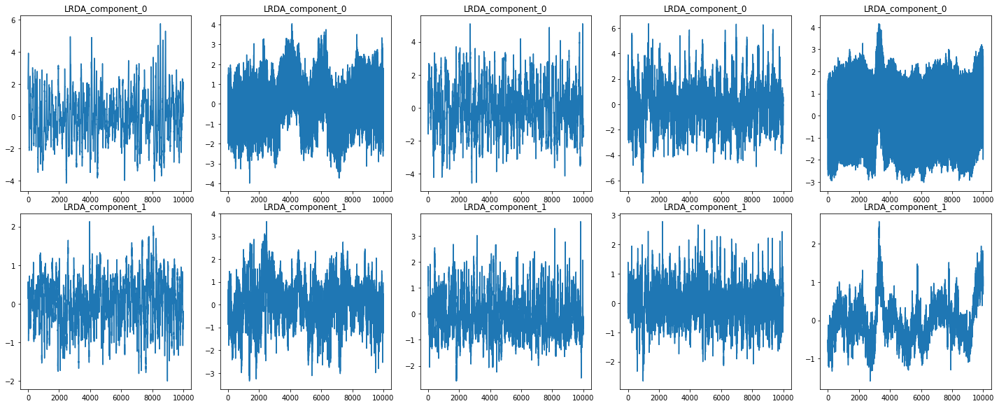

In [82]:
lrda1_g2yaxis, lrda1_g2yaxis_ratio = pca_function(scale(lrda_df, lrda_random[0]), group2_yaxis, 2)
lrda2_g2yaxis, lrda2_g2yaxis_ratio = pca_function(scale(lrda_df, lrda_random[1]), group2_yaxis, 2)
lrda3_g2yaxis, lrda3_g2yaxis_ratio = pca_function(scale(lrda_df, lrda_random[2]), group2_yaxis, 2)
lrda4_g2yaxis, lrda4_g2yaxis_ratio = pca_function(scale(lrda_df, lrda_random[3]), group2_yaxis, 2)
lrda5_g2yaxis, lrda5_g2yaxis_ratio = pca_function(scale(lrda_df, lrda_random[4]), group2_yaxis, 2)

components = lrda1_g2yaxis.columns

sub_eeg_list = [lrda1_g2yaxis, lrda2_g2yaxis, lrda3_g2yaxis, lrda4_g2yaxis, lrda5_g2yaxis]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

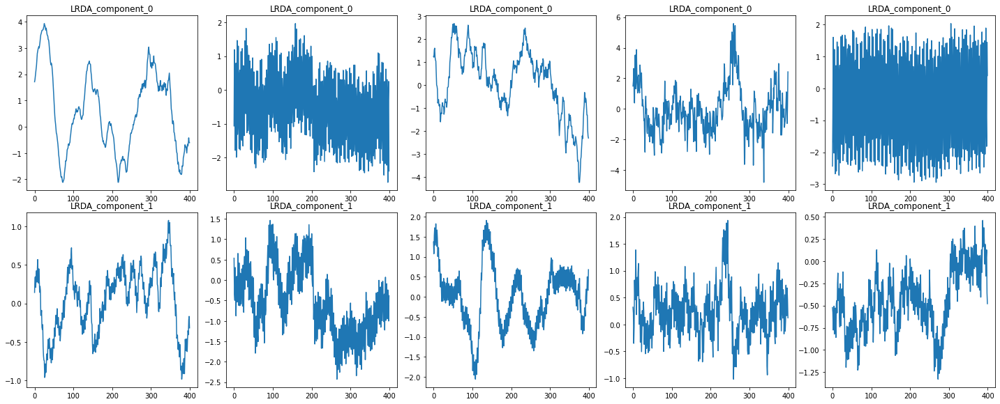

In [83]:
sub_eeg_list = [lrda1_g2yaxis[0:400], lrda2_g2yaxis[0:400], lrda3_g2yaxis[0:400], lrda4_g2yaxis[0:400], lrda5_g2yaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

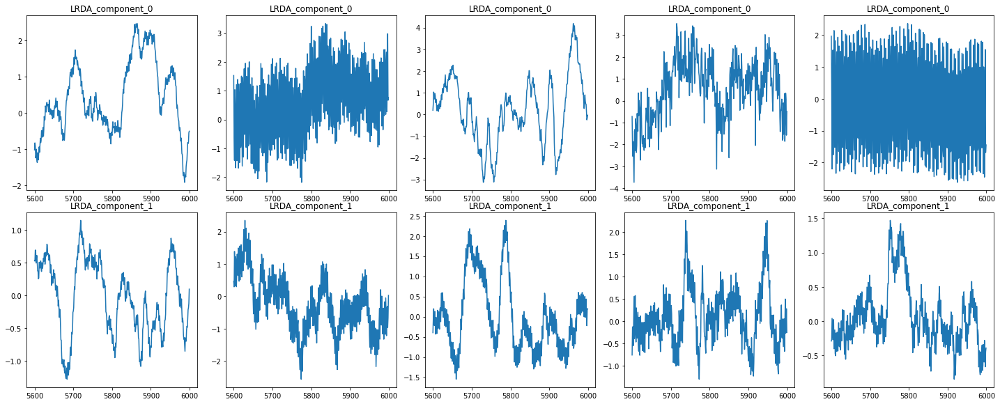

In [84]:
sub_eeg_list = [lrda1_g2yaxis[5600:6000], lrda2_g2yaxis[5600:6000], lrda3_g2yaxis[5600:6000], lrda4_g2yaxis[5600:6000], lrda5_g2yaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 8, 20)

##### GRDA Q1

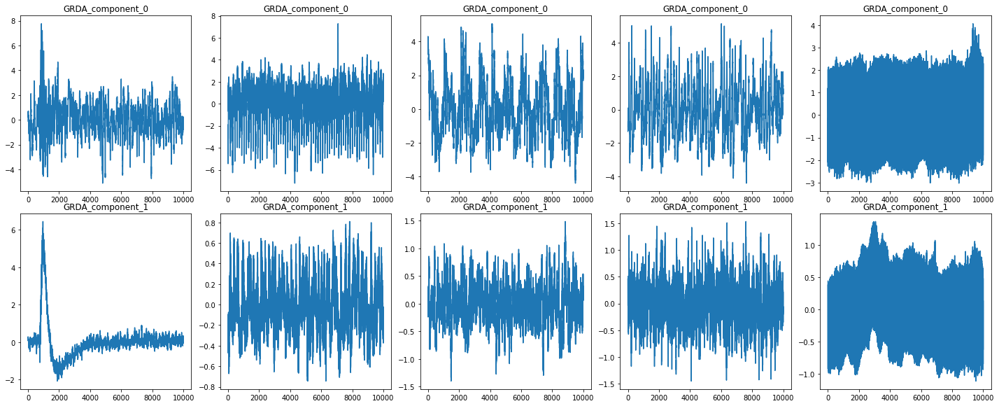

In [85]:
grda1_g2q1, grda1_g2q1_ratio = pca_function(scale(grda_df, grda_random[0]), group2_q1, 2)
grda2_g2q1, grda2_g2q1_ratio = pca_function(scale(grda_df, grda_random[1]), group2_q1, 2)
grda3_g2q1, grda3_g2q1_ratio = pca_function(scale(grda_df, grda_random[2]), group2_q1, 2)
grda4_g2q1, grda4_g2q1_ratio = pca_function(scale(grda_df, grda_random[3]), group2_q1, 2)
grda5_g2q1, grda5_g2q1_ratio = pca_function(scale(grda_df, grda_random[4]), group2_q1, 2)

components = grda1_g2q1.columns

sub_eeg_list = [grda1_g2q1, grda2_g2q1, grda3_g2q1, grda4_g2q1, grda5_g2q1]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

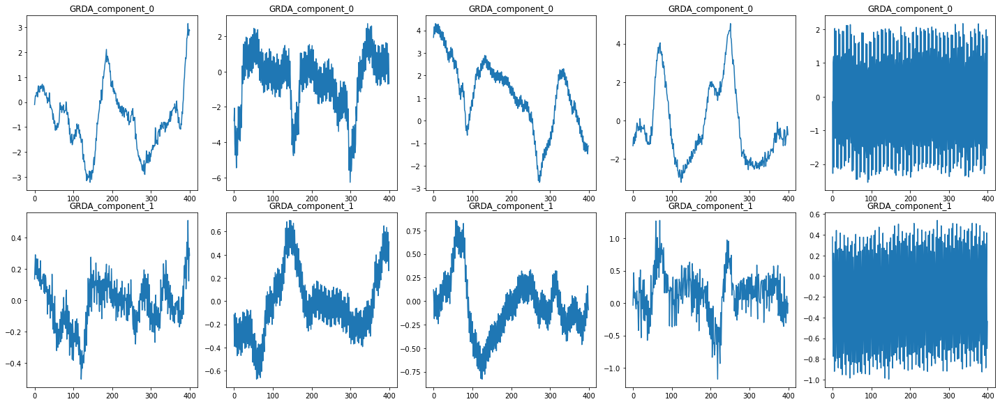

In [86]:
sub_eeg_list = [grda1_g2q1[0:400], grda2_g2q1[0:400], grda3_g2q1[0:400], grda4_g2q1[0:400], grda5_g2q1[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

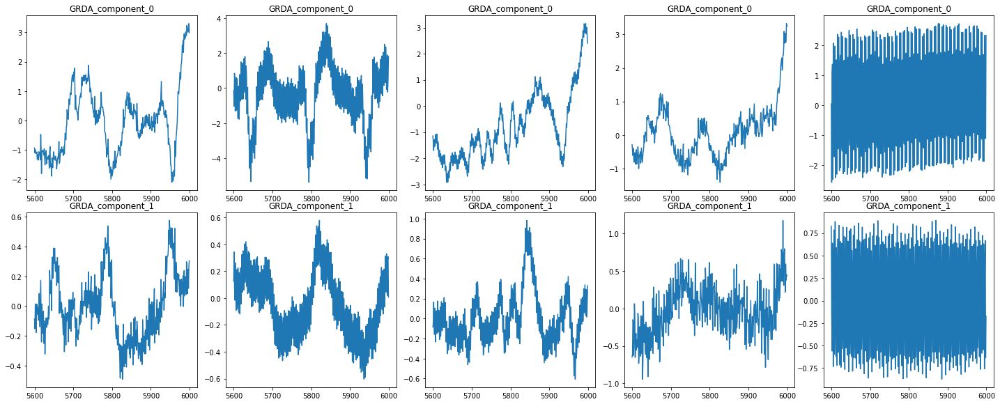

In [87]:
sub_eeg_list = [grda1_g2q1[5600:6000], grda2_g2q1[5600:6000], grda3_g2q1[5600:6000], grda4_g2q1[5600:6000], grda5_g2q1[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

##### GRDA Q2

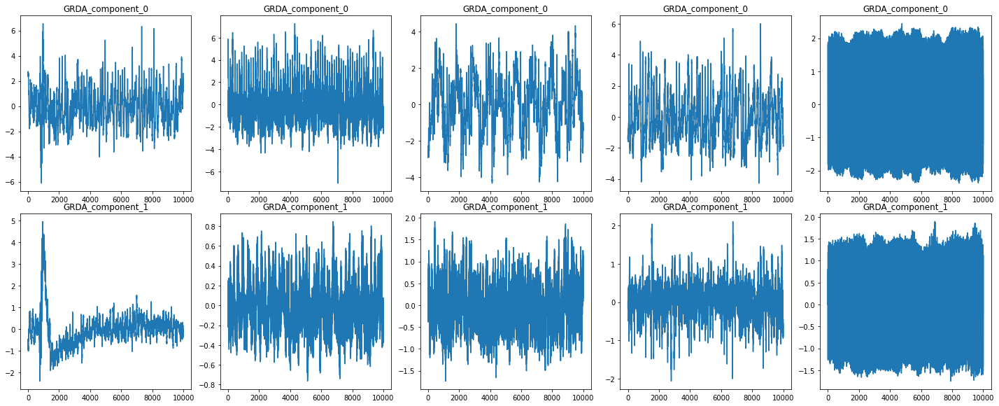

In [88]:
grda1_g2q2, grda1_g2q2_ratio = pca_function(scale(grda_df, grda_random[0]), group2_q2, 2)
grda2_g2q2, grda2_g2q2_ratio = pca_function(scale(grda_df, grda_random[1]), group2_q2, 2)
grda3_g2q2, grda3_g2q2_ratio = pca_function(scale(grda_df, grda_random[2]), group2_q2, 2)
grda4_g2q2, grda4_g2q2_ratio = pca_function(scale(grda_df, grda_random[3]), group2_q2, 2)
grda5_g2q2, grda5_g2q2_ratio = pca_function(scale(grda_df, grda_random[4]), group2_q2, 2)

components = grda1_g2q2.columns

sub_eeg_list = [grda1_g2q2, grda2_g2q2, grda3_g2q2, grda4_g2q2, grda5_g2q2]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

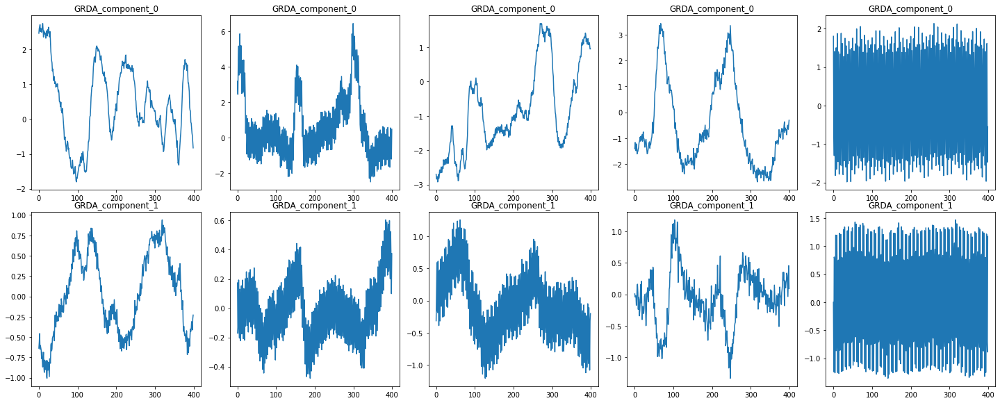

In [89]:
sub_eeg_list = [grda1_g2q2[0:400], grda2_g2q2[0:400], grda3_g2q2[0:400], grda4_g2q2[0:400], grda5_g2q2[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

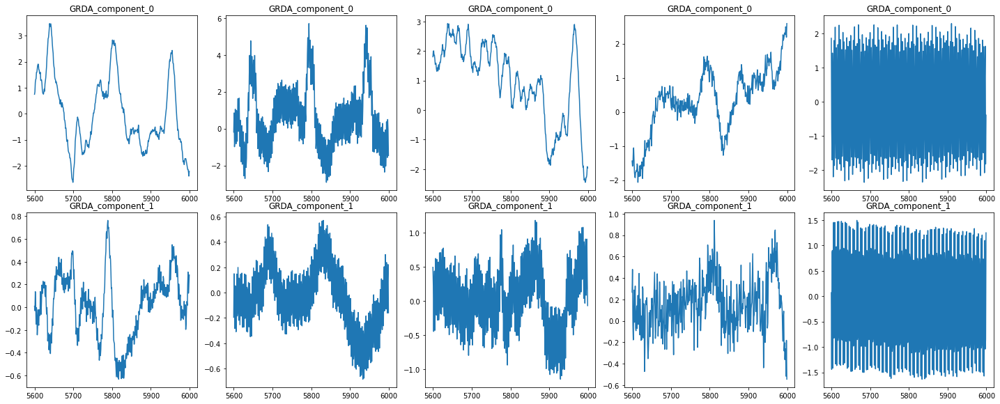

In [90]:
sub_eeg_list = [grda1_g2q2[5600:6000], grda2_g2q2[5600:6000], grda3_g2q2[5600:6000], grda4_g2q2[5600:6000], grda5_g2q2[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

##### GRDA Q3

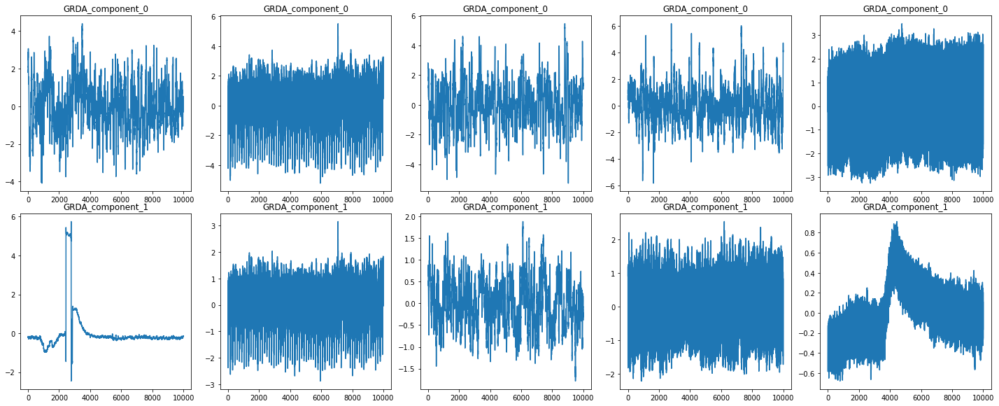

In [91]:
grda1_g2q3, grda1_g2q3_ratio = pca_function(scale(grda_df, grda_random[0]), group2_q3, 2)
grda2_g2q3, grda2_g2q3_ratio = pca_function(scale(grda_df, grda_random[1]), group2_q3, 2)
grda3_g2q3, grda3_g2q3_ratio = pca_function(scale(grda_df, grda_random[2]), group2_q3, 2)
grda4_g2q3, grda4_g2q3_ratio = pca_function(scale(grda_df, grda_random[3]), group2_q3, 2)
grda5_g2q3, grda5_g2q3_ratio = pca_function(scale(grda_df, grda_random[4]), group2_q3, 2)

components = grda1_g2q3.columns

sub_eeg_list = [grda1_g2q3, grda2_g2q3, grda3_g2q3, grda4_g2q3, grda5_g2q3]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

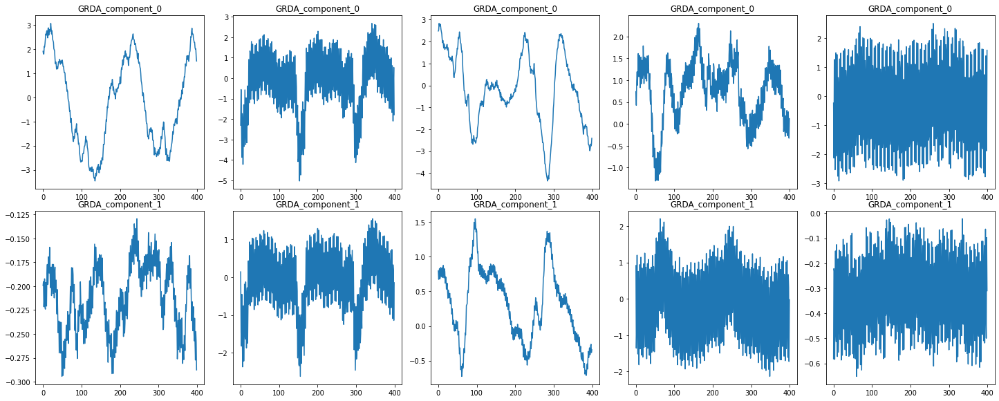

In [92]:
sub_eeg_list = [grda1_g2q3[0:400], grda2_g2q3[0:400], grda3_g2q3[0:400], grda4_g2q3[0:400], grda5_g2q3[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

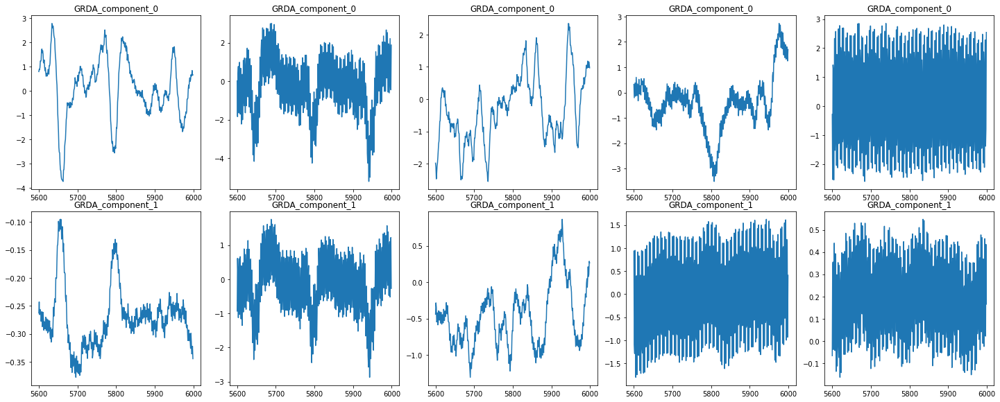

In [93]:
sub_eeg_list = [grda1_g2q3[5600:6000], grda2_g2q3[5600:6000], grda3_g2q3[5600:6000], grda4_g2q3[5600:6000], grda5_g2q3[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

##### GRDA Q4

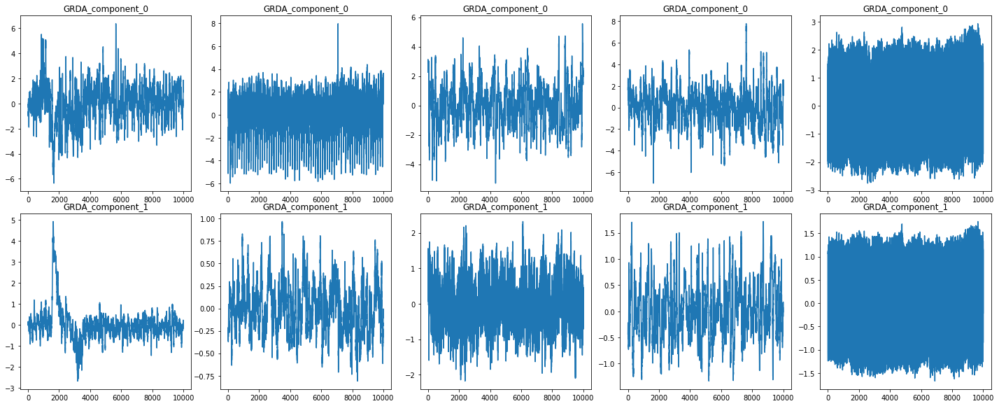

In [94]:
grda1_g2q4, grda1_g2q4_ratio = pca_function(scale(grda_df, grda_random[0]), group2_q4, 2)
grda2_g2q4, grda2_g2q4_ratio = pca_function(scale(grda_df, grda_random[1]), group2_q4, 2)
grda3_g2q4, grda3_g2q4_ratio = pca_function(scale(grda_df, grda_random[2]), group2_q4, 2)
grda4_g2q4, grda4_g2q4_ratio = pca_function(scale(grda_df, grda_random[3]), group2_q4, 2)
grda5_g2q4, grda5_g2q4_ratio = pca_function(scale(grda_df, grda_random[4]), group2_q4, 2)

components = grda1_g2q4.columns

sub_eeg_list = [grda1_g2q4, grda2_g2q4, grda3_g2q4, grda4_g2q4, grda5_g2q4]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

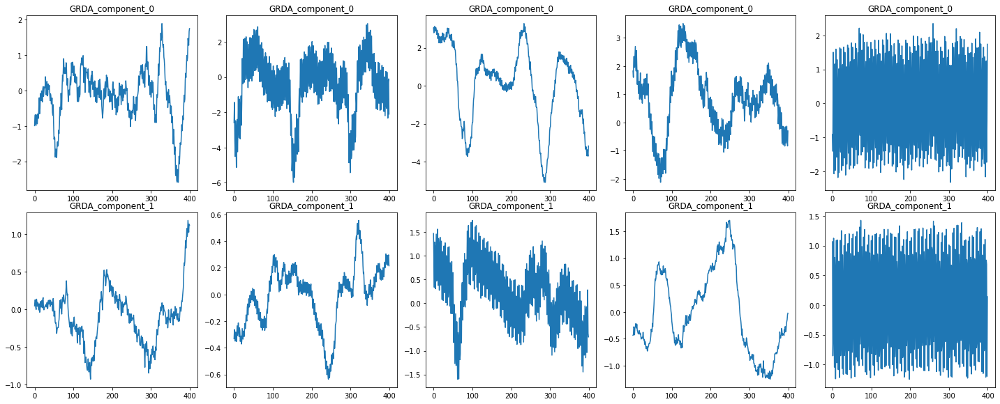

In [95]:
sub_eeg_list = [grda1_g2q4[0:400], grda2_g2q4[0:400], grda3_g2q4[0:400], grda4_g2q4[0:400], grda5_g2q4[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

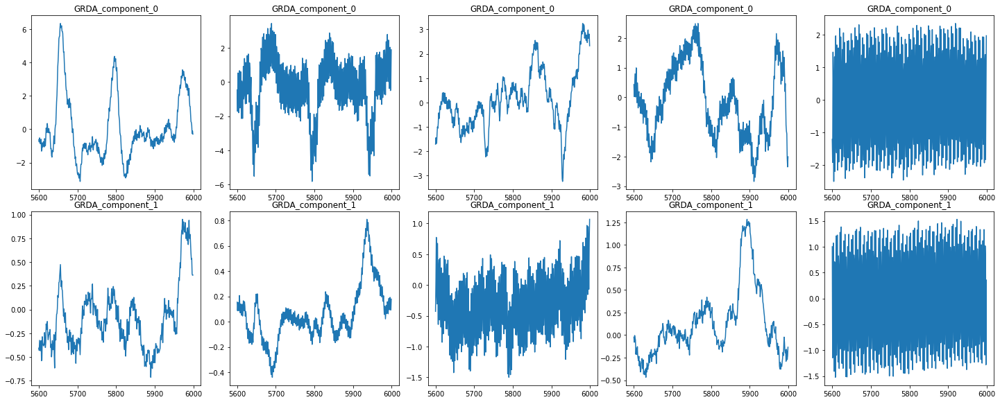

In [96]:
sub_eeg_list = [grda1_g2q4[5600:6000], grda2_g2q4[5600:6000], grda3_g2q4[5600:6000], grda4_g2q4[5600:6000], grda5_g2q4[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

##### GRDA X

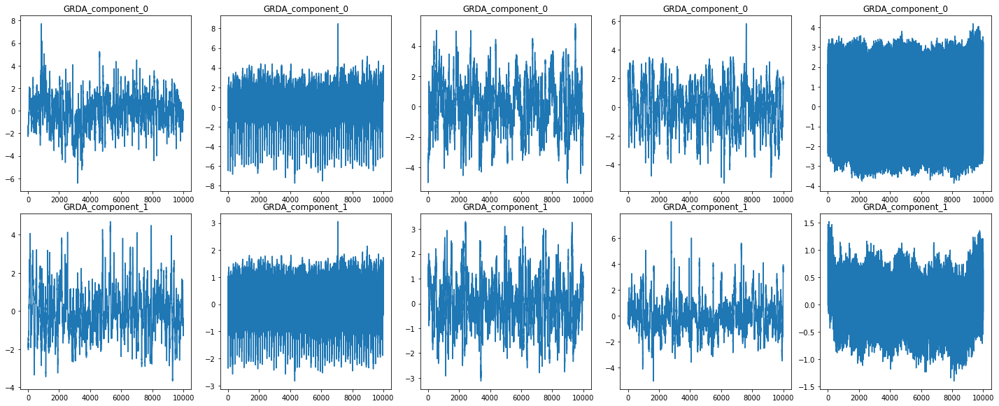

In [97]:
grda1_g2xaxis, grda1_g2xaxis_ratio = pca_function(scale(grda_df, grda_random[0]), group2_xaxis, 2)
grda2_g2xaxis, grda2_g2xaxis_ratio = pca_function(scale(grda_df, grda_random[1]), group2_xaxis, 2)
grda3_g2xaxis, grda3_g2xaxis_ratio = pca_function(scale(grda_df, grda_random[2]), group2_xaxis, 2)
grda4_g2xaxis, grda4_g2xaxis_ratio = pca_function(scale(grda_df, grda_random[3]), group2_xaxis, 2)
grda5_g2xaxis, grda5_g2xaxis_ratio = pca_function(scale(grda_df, grda_random[4]), group2_xaxis, 2)

components = grda1_g2xaxis.columns

sub_eeg_list = [grda1_g2xaxis, grda2_g2xaxis, grda3_g2xaxis, grda4_g2xaxis, grda5_g2xaxis]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

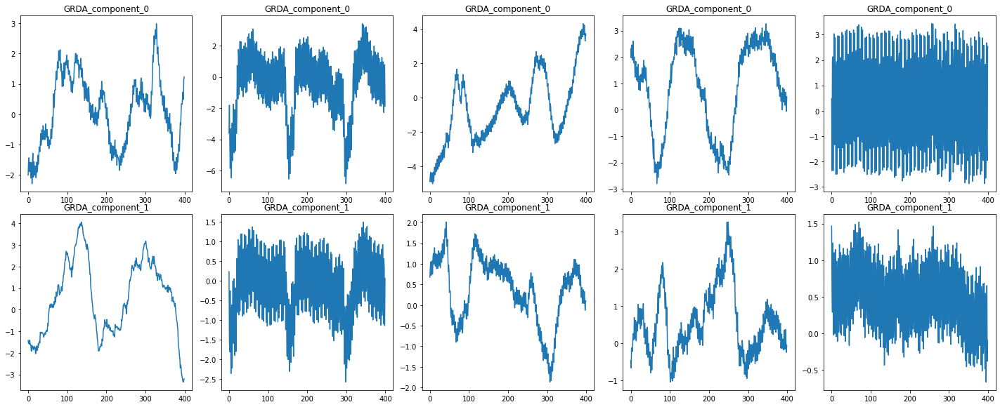

In [98]:
sub_eeg_list = [grda1_g2xaxis[0:400], grda2_g2xaxis[0:400], grda3_g2xaxis[0:400], grda4_g2xaxis[0:400], grda5_g2xaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

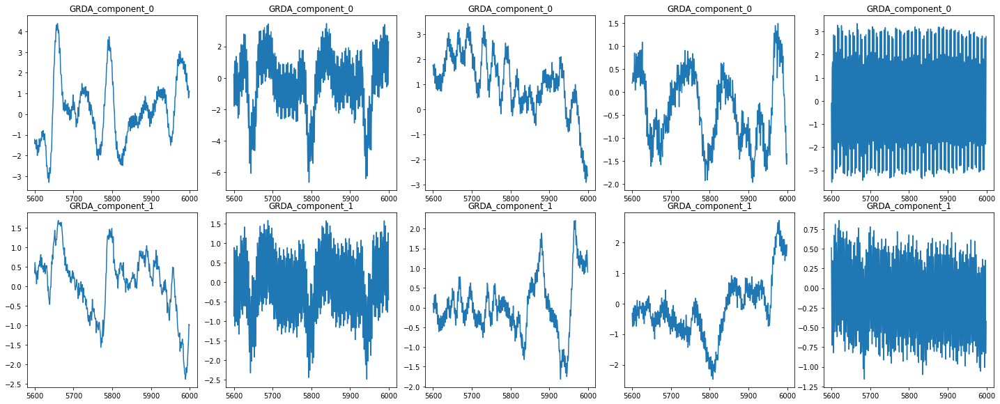

In [99]:
sub_eeg_list = [grda1_g2xaxis[5600:6000], grda2_g2xaxis[5600:6000], grda3_g2xaxis[5600:6000], grda4_g2xaxis[5600:6000], grda5_g2xaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

##### GRDA Y

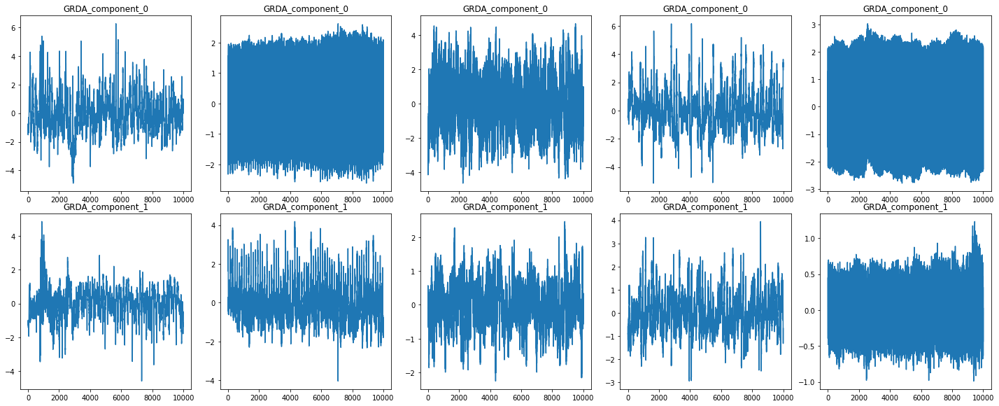

In [100]:
grda1_g2yaxis, grda1_g2yaxis_ratio = pca_function(scale(grda_df, grda_random[0]), group2_yaxis, 2)
grda2_g2yaxis, grda2_g2yaxis_ratio = pca_function(scale(grda_df, grda_random[1]), group2_yaxis, 2)
grda3_g2yaxis, grda3_g2yaxis_ratio = pca_function(scale(grda_df, grda_random[2]), group2_yaxis, 2)
grda4_g2yaxis, grda4_g2yaxis_ratio = pca_function(scale(grda_df, grda_random[3]), group2_yaxis, 2)
grda5_g2yaxis, grda5_g2yaxis_ratio = pca_function(scale(grda_df, grda_random[4]), group2_yaxis, 2)

components = grda1_g2yaxis.columns

sub_eeg_list = [grda1_g2yaxis, grda2_g2yaxis, grda3_g2yaxis, grda4_g2yaxis, grda5_g2yaxis]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

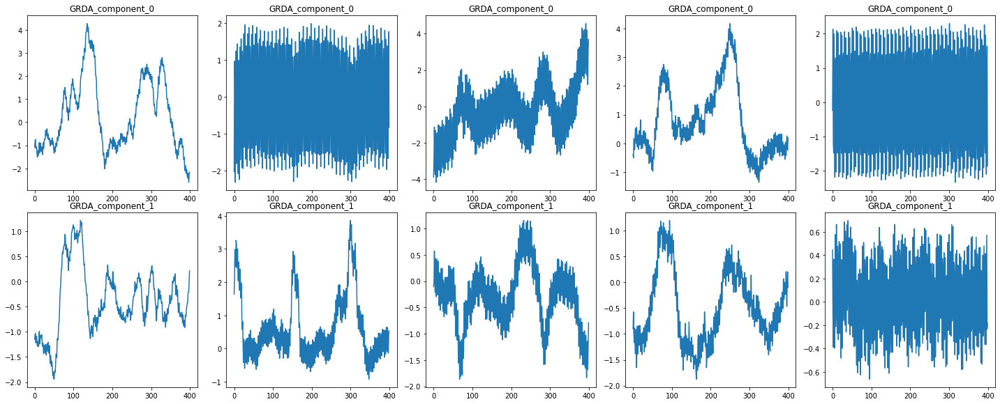

In [101]:
sub_eeg_list = [grda1_g2yaxis[0:400], grda2_g2yaxis[0:400], grda3_g2yaxis[0:400], grda4_g2yaxis[0:400], grda5_g2yaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

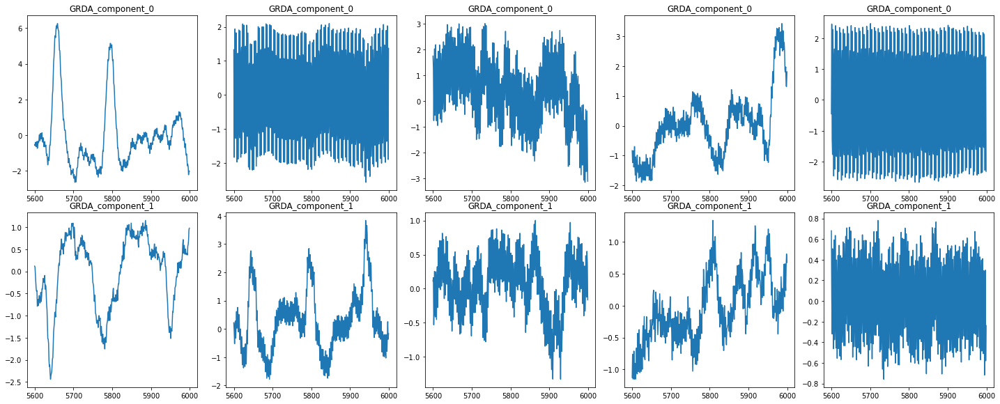

In [102]:
sub_eeg_list = [grda1_g2yaxis[5600:6000], grda2_g2yaxis[5600:6000], grda3_g2yaxis[5600:6000], grda4_g2yaxis[5600:6000], grda5_g2yaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 8, 20)

##### Other Q1

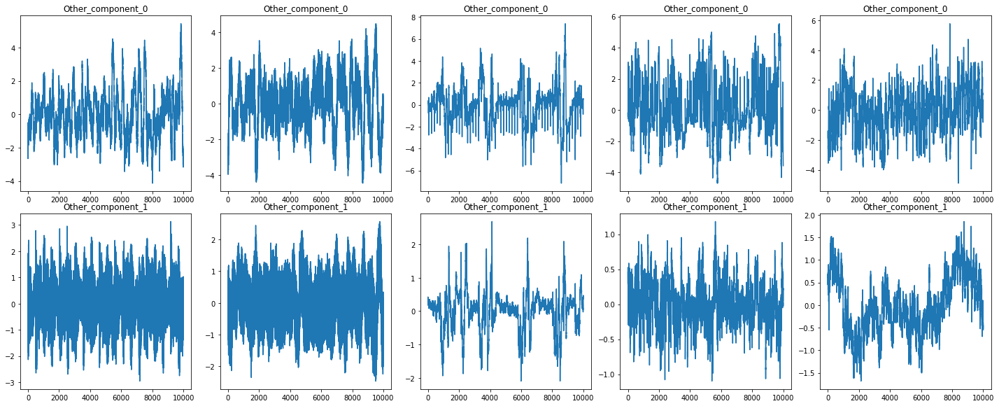

In [103]:
other1_g2q1, other1_g2q1_ratio = pca_function(scale(other_df, other_random[0]), group2_q1, 2)
other2_g2q1, other2_g2q1_ratio = pca_function(scale(other_df, other_random[1]), group2_q1, 2)
other3_g2q1, other3_g2q1_ratio = pca_function(scale(other_df, other_random[2]), group2_q1, 2)
other4_g2q1, other4_g2q1_ratio = pca_function(scale(other_df, other_random[3]), group2_q1, 2)
other5_g2q1, other5_g2q1_ratio = pca_function(scale(other_df, other_random[4]), group2_q1, 2)

components = other1_g2q1.columns

sub_eeg_list = [other1_g2q1, other2_g2q1, other3_g2q1, other4_g2q1, other5_g2q1]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

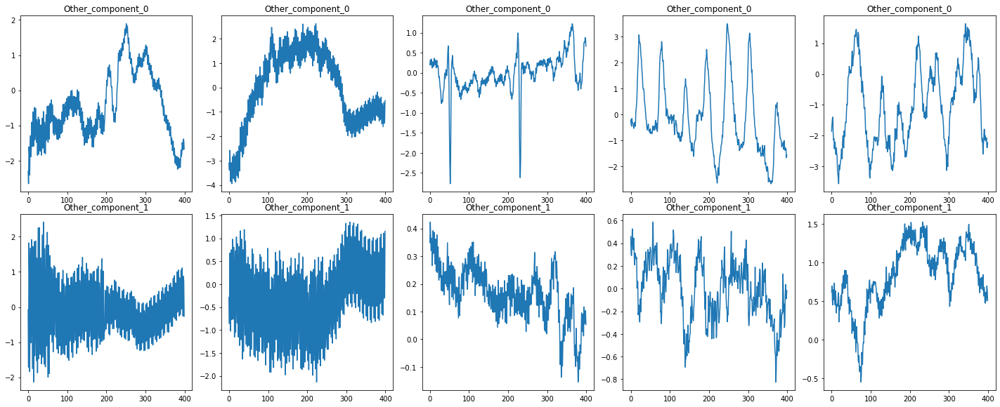

In [104]:
sub_eeg_list = [other1_g2q1[0:400], other2_g2q1[0:400], other3_g2q1[0:400], other4_g2q1[0:400], other5_g2q1[0:400]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

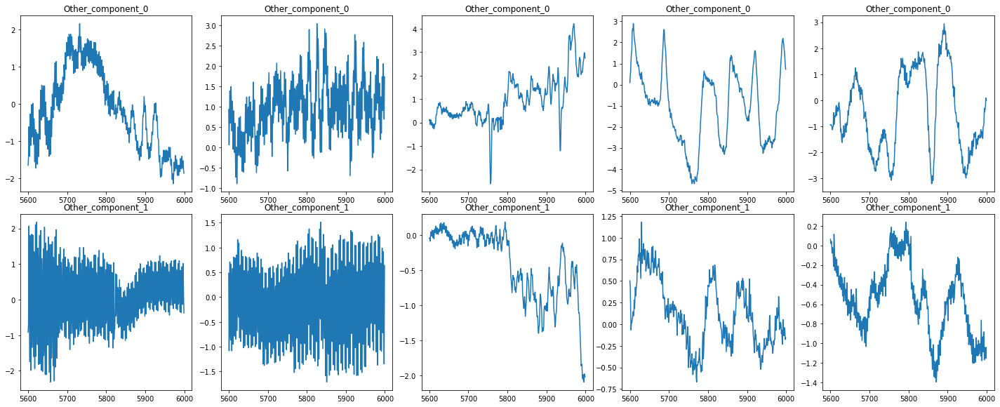

In [105]:
sub_eeg_list = [other1_g2q1[5600:6000], other2_g2q1[5600:6000], other3_g2q1[5600:6000], other4_g2q1[5600:6000], other5_g2q1[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

##### Other Q2

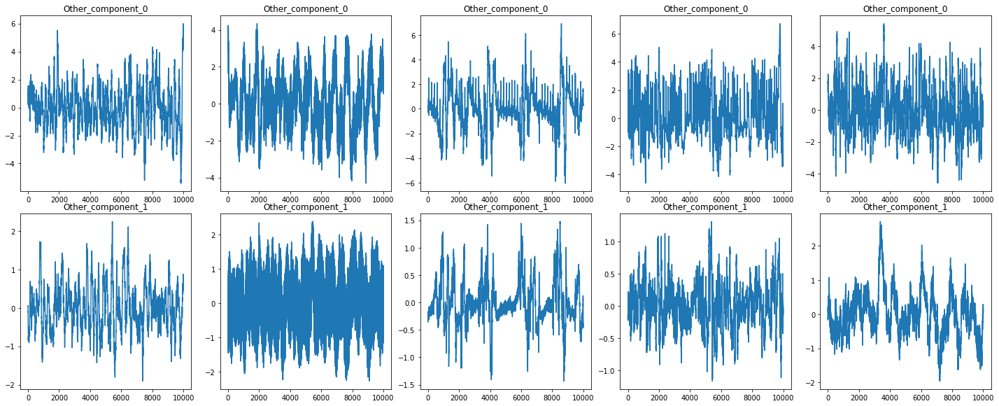

In [106]:
other1_g2q2, other1_g2q2_ratio = pca_function(scale(other_df, other_random[0]), group2_q2, 2)
other2_g2q2, other2_g2q2_ratio = pca_function(scale(other_df, other_random[1]), group2_q2, 2)
other3_g2q2, other3_g2q2_ratio = pca_function(scale(other_df, other_random[2]), group2_q2, 2)
other4_g2q2, other4_g2q2_ratio = pca_function(scale(other_df, other_random[3]), group2_q2, 2)
other5_g2q2, other5_g2q2_ratio = pca_function(scale(other_df, other_random[4]), group2_q2, 2)

components = other1_g2q2.columns

sub_eeg_list = [other1_g2q2, other2_g2q2, other3_g2q2, other4_g2q2, other5_g2q2]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

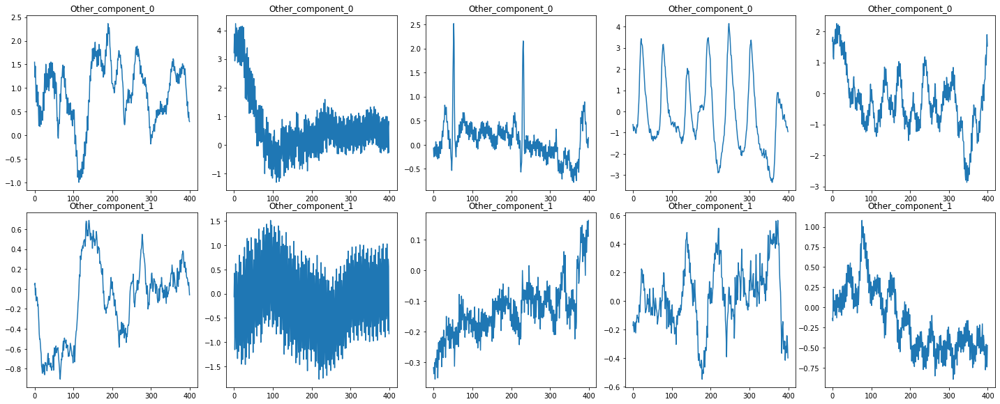

In [107]:
sub_eeg_list = [other1_g2q2[0:400], other2_g2q2[0:400], other3_g2q2[0:400], other4_g2q2[0:400], other5_g2q2[0:400]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

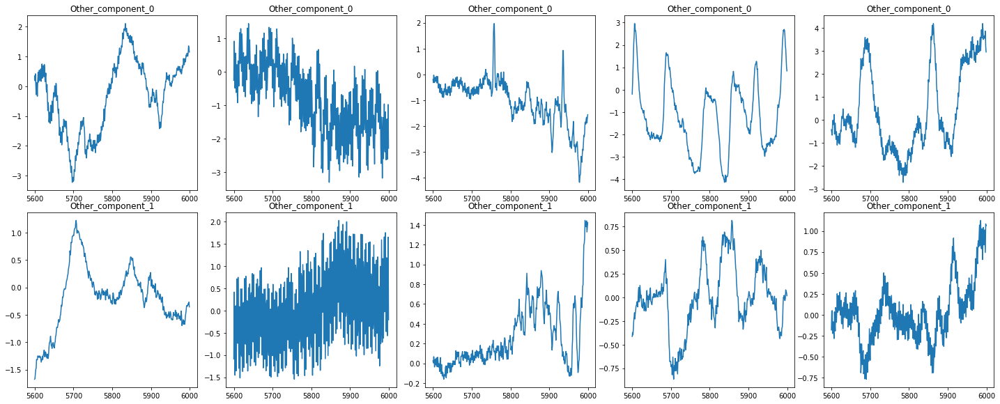

In [108]:
sub_eeg_list = [other1_g2q2[5600:6000], other2_g2q2[5600:6000], other3_g2q2[5600:6000], other4_g2q2[5600:6000], other5_g2q2[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

##### Other Q3

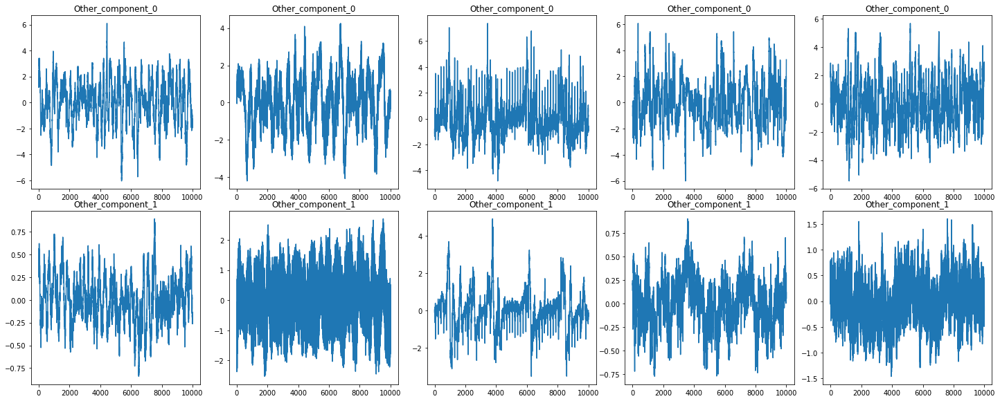

In [109]:
other1_g2q3, other1_g2q3_ratio = pca_function(scale(other_df, other_random[0]), group2_q3, 2)
other2_g2q3, other2_g2q3_ratio = pca_function(scale(other_df, other_random[1]), group2_q3, 2)
other3_g2q3, other3_g2q3_ratio = pca_function(scale(other_df, other_random[2]), group2_q3, 2)
other4_g2q3, other4_g2q3_ratio = pca_function(scale(other_df, other_random[3]), group2_q3, 2)
other5_g2q3, other5_g2q3_ratio = pca_function(scale(other_df, other_random[4]), group2_q3, 2)

components = other1_g2q3.columns

sub_eeg_list = [other1_g2q3, other2_g2q3, other3_g2q3, other4_g2q3, other5_g2q3]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

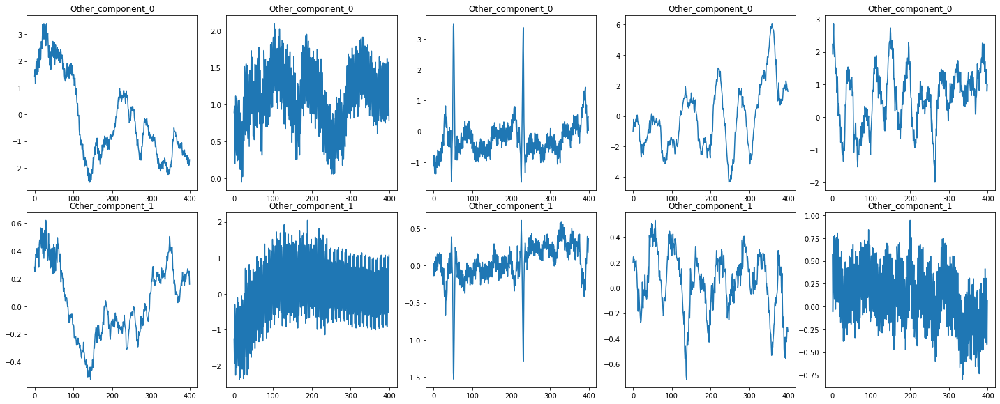

In [110]:
sub_eeg_list = [other1_g2q3[0:400], other2_g2q3[0:400], other3_g2q3[0:400], other4_g2q3[0:400], other5_g2q3[0:400]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

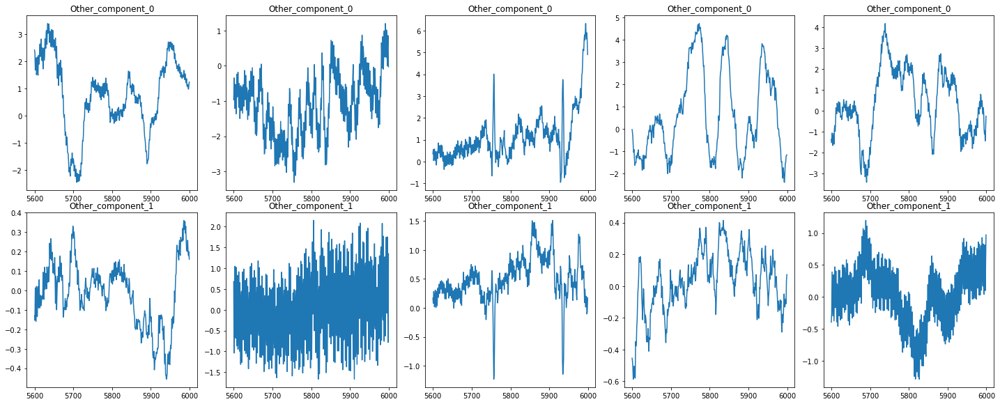

In [111]:
sub_eeg_list = [other1_g2q3[5600:6000], other2_g2q3[5600:6000], other3_g2q3[5600:6000], other4_g2q3[5600:6000], other5_g2q3[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

##### Other Q4

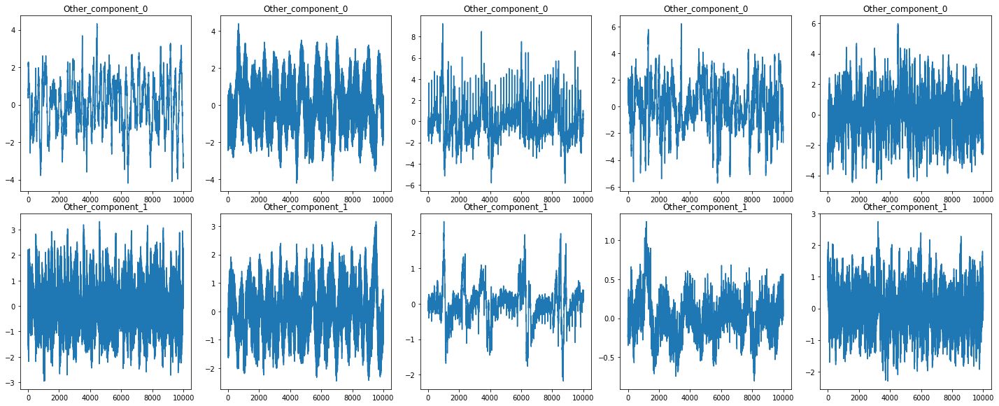

In [112]:
other1_g2q4, other1_g2q4_ratio = pca_function(scale(other_df, other_random[0]), group2_q4, 2)
other2_g2q4, other2_g2q4_ratio = pca_function(scale(other_df, other_random[1]), group2_q4, 2)
other3_g2q4, other3_g2q4_ratio = pca_function(scale(other_df, other_random[2]), group2_q4, 2)
other4_g2q4, other4_g2q4_ratio = pca_function(scale(other_df, other_random[3]), group2_q4, 2)
other5_g2q4, other5_g2q4_ratio = pca_function(scale(other_df, other_random[4]), group2_q4, 2)

components = other1_g2q4.columns

sub_eeg_list = [other1_g2q4, other2_g2q4, other3_g2q4, other4_g2q4, other5_g2q4]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

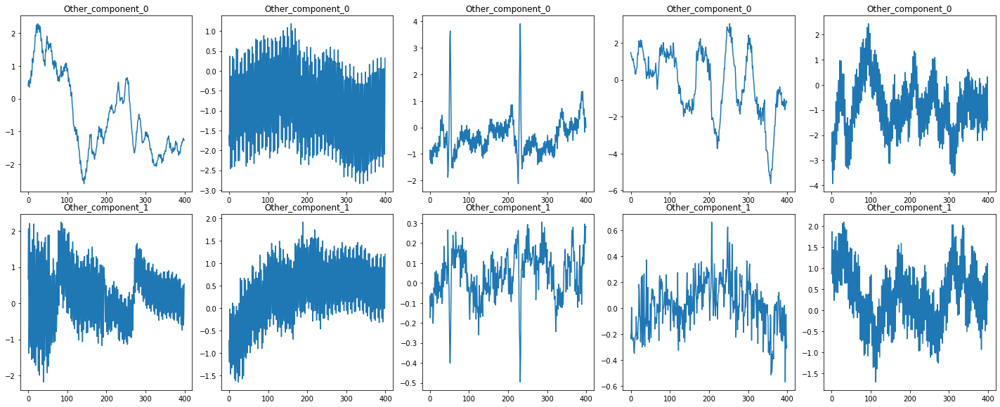

In [113]:
sub_eeg_list = [other1_g2q4[0:400], other2_g2q4[0:400], other3_g2q4[0:400], other4_g2q4[0:400], other5_g2q4[0:400]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

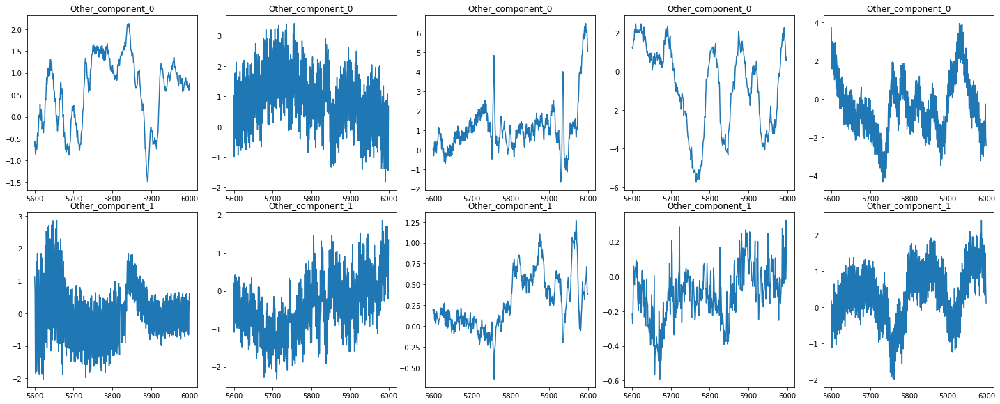

In [114]:
sub_eeg_list = [other1_g2q4[5600:6000], other2_g2q4[5600:6000], other3_g2q4[5600:6000], other4_g2q4[5600:6000], other5_g2q4[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

##### Other X

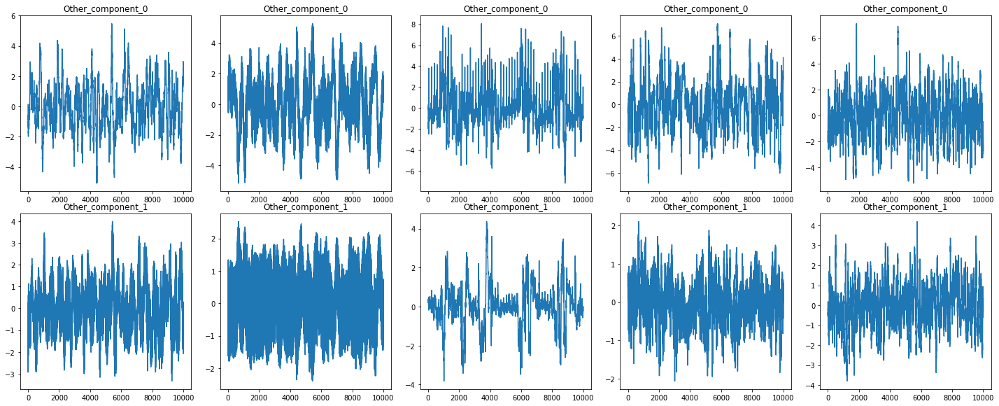

In [115]:
other1_g2xaxis, other1_g2xaxis_ratio = pca_function(scale(other_df, other_random[0]), group2_xaxis, 2)
other2_g2xaxis, other2_g2xaxis_ratio = pca_function(scale(other_df, other_random[1]), group2_xaxis, 2)
other3_g2xaxis, other3_g2xaxis_ratio = pca_function(scale(other_df, other_random[2]), group2_xaxis, 2)
other4_g2xaxis, other4_g2xaxis_ratio = pca_function(scale(other_df, other_random[3]), group2_xaxis, 2)
other5_g2xaxis, other5_g2xaxis_ratio = pca_function(scale(other_df, other_random[4]), group2_xaxis, 2)

components = other1_g2xaxis.columns

sub_eeg_list = [other1_g2xaxis, other2_g2xaxis, other3_g2xaxis, other4_g2xaxis, other5_g2xaxis]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

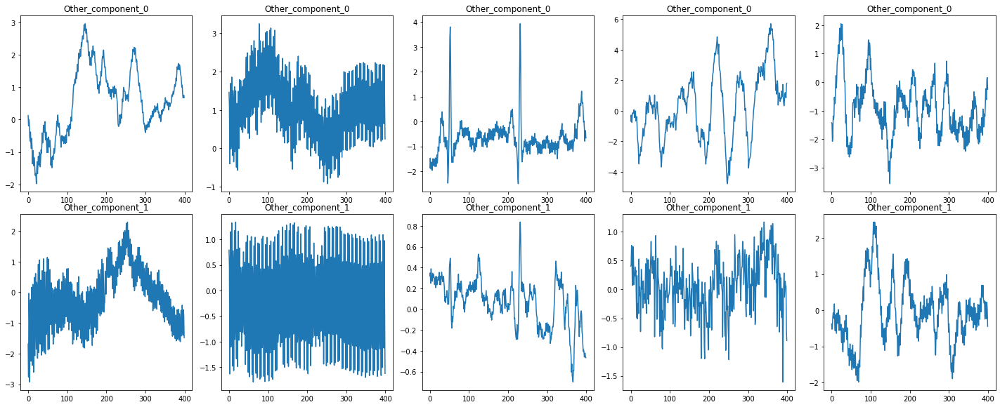

In [116]:
sub_eeg_list = [other1_g2xaxis[0:400], other2_g2xaxis[0:400], other3_g2xaxis[0:400], other4_g2xaxis[0:400], other5_g2xaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

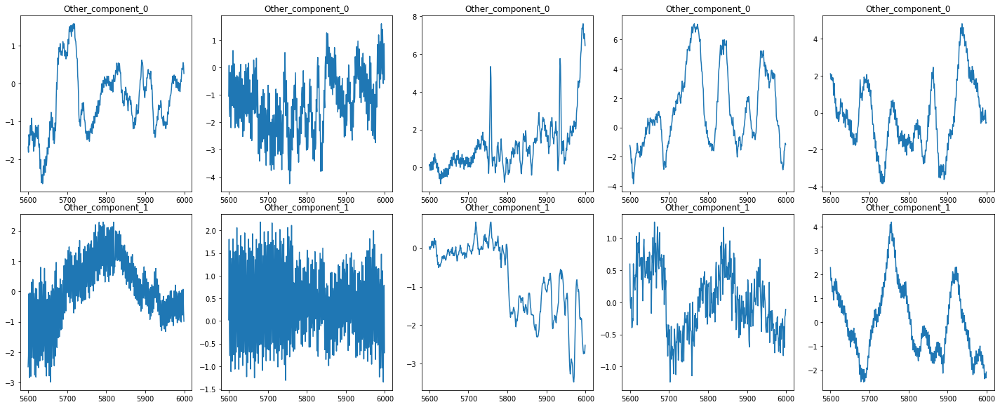

In [117]:
sub_eeg_list = [other1_g2xaxis[5600:6000], other2_g2xaxis[5600:6000], other3_g2xaxis[5600:6000], other4_g2xaxis[5600:6000], other5_g2xaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

##### Other Y

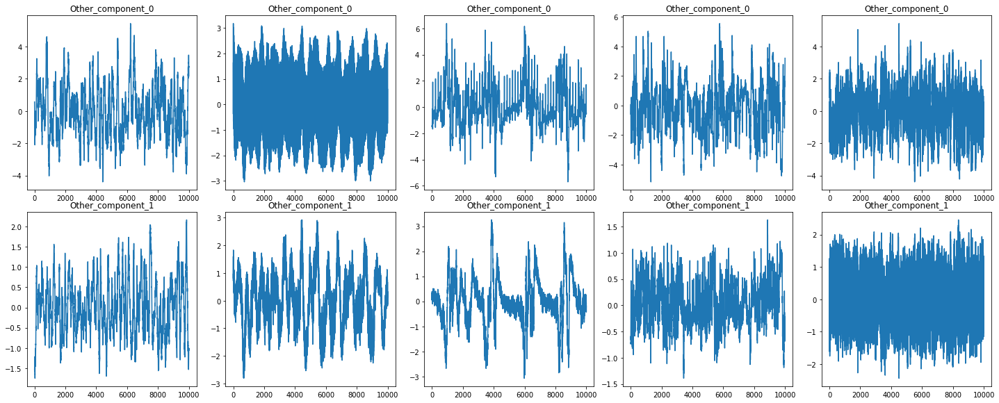

In [118]:
other1_g2yaxis, other1_g2yaxis_ratio = pca_function(scale(other_df, other_random[0]), group2_yaxis, 2)
other2_g2yaxis, other2_g2yaxis_ratio = pca_function(scale(other_df, other_random[1]), group2_yaxis, 2)
other3_g2yaxis, other3_g2yaxis_ratio = pca_function(scale(other_df, other_random[2]), group2_yaxis, 2)
other4_g2yaxis, other4_g2yaxis_ratio = pca_function(scale(other_df, other_random[3]), group2_yaxis, 2)
other5_g2yaxis, other5_g2yaxis_ratio = pca_function(scale(other_df, other_random[4]), group2_yaxis, 2)

components = other1_g2yaxis.columns

sub_eeg_list = [other1_g2yaxis, other2_g2yaxis, other3_g2yaxis, other4_g2yaxis, other5_g2yaxis]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

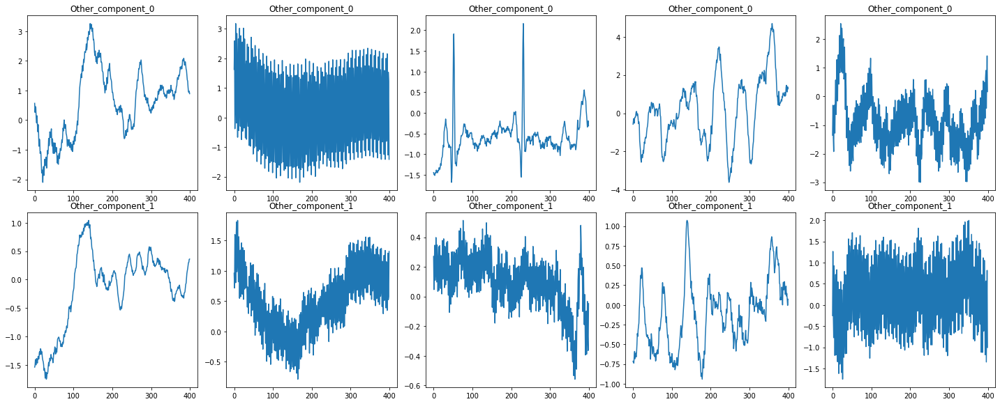

In [119]:
sub_eeg_list = [other1_g2yaxis[0:400], other2_g2yaxis[0:400], other3_g2yaxis[0:400], other4_g2yaxis[0:400], other5_g2yaxis[0:400]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)

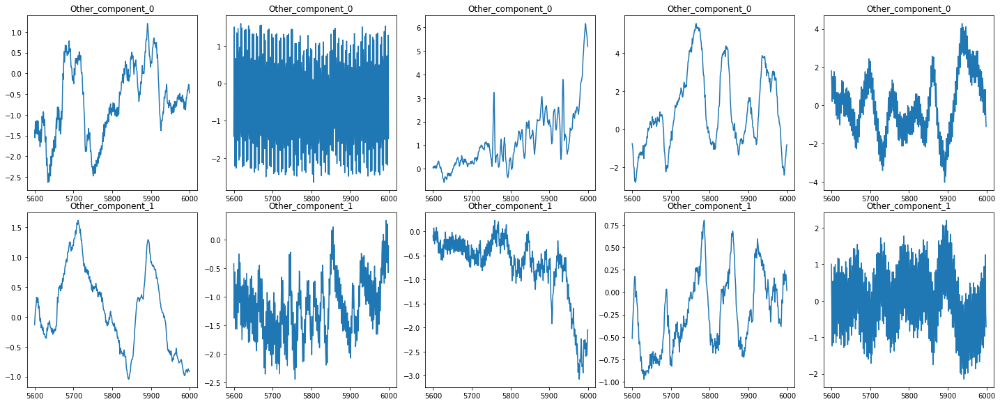

In [120]:
sub_eeg_list = [other1_g2yaxis[5600:6000], other2_g2yaxis[5600:6000], other3_g2yaxis[5600:6000], other4_g2yaxis[5600:6000], other5_g2yaxis[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 8, 20)